In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pylab as plt
from mceq2d_dists import MCEQDist2D, CalcMCEqHists
plt.rcParams['text.usetex'] = True
plt.rcParams["figure.dpi"] = 600

In [2]:
from pathlib import Path
corsika_data_file = "07_corsika_data/corsika_07.h5"

dir_for_figures = Path("/hetghome/antonpr/xmax_sigma/flincpy/scripts/")
dir_for_figures = dir_for_figures/"plots/03_mceq2d_comp"

# MCEq initialization calculations

In [3]:
mceq_sol = MCEQDist2D(
                 energy = 100,
                 pdg_id = 2212,
                 theta_deg = 30,
                 slant_depths = [143, 647, 1033],
                 energy_range = [1e-1, 1e4],
                 interaction_model = "DPMJETIII191", 
                 hybrid_crossover = 0.1,
                 density_model = ("CORSIKA", ("USStd", None)))

MCEqRun::set_interaction_model(): DPMJETIII191
MCEqRun::set_density_model(): Setting density profile to CORSIKA ('USStd', None)
MCEqRun::set_primary_model(): Primary model set to Hillas-Gaisser (H3a)


100%|██████████| 2743/2743 [00:21<00:00, 127.27it/s]


In [4]:
mceq_sol1 = MCEQDist2D(
                 energy = 100,
                 pdg_id = 2212,
                 theta_deg = 30,
                #  slant_depths = [143, 647, 1033],
                 slant_depths = [143, 638, 1167],
                 energy_range = [1e-1, 1e4],
                 interaction_model = "DPMJETIII191", 
                 hybrid_crossover = 0.1,
                 density_model = ("CORSIKA", ("USStd", None)))

MCEqRun::set_interaction_model(): DPMJETIII191
MCEqRun::set_density_model(): Setting density profile to CORSIKA ('USStd', None)
MCEqRun::set_primary_model(): Primary model set to Hillas-Gaisser (H3a)


100%|██████████| 2743/2743 [00:20<00:00, 133.17it/s]


In [5]:
mceq_dists = CalcMCEqHists(mceq_sol, particles = [12, 13, 14])

In [6]:
mceq_dists1 = CalcMCEqHists(mceq_sol1, particles = [12, 13, 14])

# Fluka initialization

In [7]:
from pathlib import Path
import sys
scripts_dir = Path("/hetghome/antonpr/xmax_sigma/flincpy/scripts")
sys.path.insert(0, str(scripts_dir/"fluka_comparison"))
from read_fluka_data import fluka_histogram, fluka_histogram_en

In [8]:
# Fluka energy distributions
fluka_hist_en = {}
for label in ("current", "develop"):
    fluka_hist_en[label] = fluka_histogram_en(label, 0)
    
fluka_energy_bins_en = fluka_hist_en["current"][0][0]

In [9]:
# Fluka angular distributions
fluka_ang_bin_merge_level = 0
fluka_hist = {}
for label in ("current", "develop"):
    fluka_hist[label] = fluka_histogram(label, fluka_ang_bin_merge_level)
    
fluka_ang_bins = fluka_hist["current"][0][0][0]   

# Corsika intializatioin

In [10]:
import sys
sys.path.append("/hetghome/antonpr/xmax_sigma/flincpy/scripts/corsika_flincpy")
from corsika_comparison import (corsika_hist_en, combined_data_en, 
                                 corsika_en_theta_2dhist,
                                 combined_ang_data)

In [11]:
# Corsika energy distributions
chist_en = corsika_hist_en(fluka_energy_bins_en, 
                           h5file=corsika_data_file)

corsika_07.h5: Number of primaries = 3.000000e+06


In [12]:
# Take a sum of particles
corsika_en_dist = {}
for i in range(3):
    corsika_en_dist[i]  = combined_data_en(chist_en, [-13, 13], i)

In [13]:
# Corsika angular distributions
# energy_bins = [1, 1.25892541, 1.99526231,  2.51188643,  3.98107171, 5.01187234]
energy_bins = [1, 1.3, 2, 2.5, 4, 5]
ang_bins = fluka_ang_bins
corsika_en_hist = corsika_en_theta_2dhist(energy_bins, 
                                          fluka_ang_bins,
                                          h5file=corsika_data_file)

corsika_comb_mu = combined_ang_data(corsika_en_hist, (-13, 13))
corsika_comb_nue = combined_ang_data(corsika_en_hist, (-12, 12))
corsika_comb_numu = combined_ang_data(corsika_en_hist, (-14, 14))

pdg = -12
xdepth=143.0, number=2.4503e+06
xdepth=647.0, number=6.2800e+06
xdepth=1033.0, number=7.1195e+06
pdg = 12
xdepth=143.0, number=2.6638e+06
xdepth=647.0, number=6.7850e+06
xdepth=1033.0, number=7.7016e+06
pdg = -13
xdepth=143.0, number=6.3909e+06
xdepth=647.0, number=6.5302e+06
xdepth=1033.0, number=4.1115e+06
pdg = 13
xdepth=143.0, number=5.7256e+06
xdepth=647.0, number=5.8239e+06
xdepth=1033.0, number=3.5279e+06
pdg = -14
xdepth=143.0, number=8.7044e+06
xdepth=647.0, number=1.8000e+07
xdepth=1033.0, number=1.9141e+07
pdg = 14
xdepth=143.0, number=9.3611e+06
xdepth=647.0, number=1.8878e+07
xdepth=1033.0, number=1.9954e+07


# Energy spectra comparisons

In [14]:
params = {'mathtext.default': 'regular',
          'text.usetex': False}          
plt.rcParams.update(params)

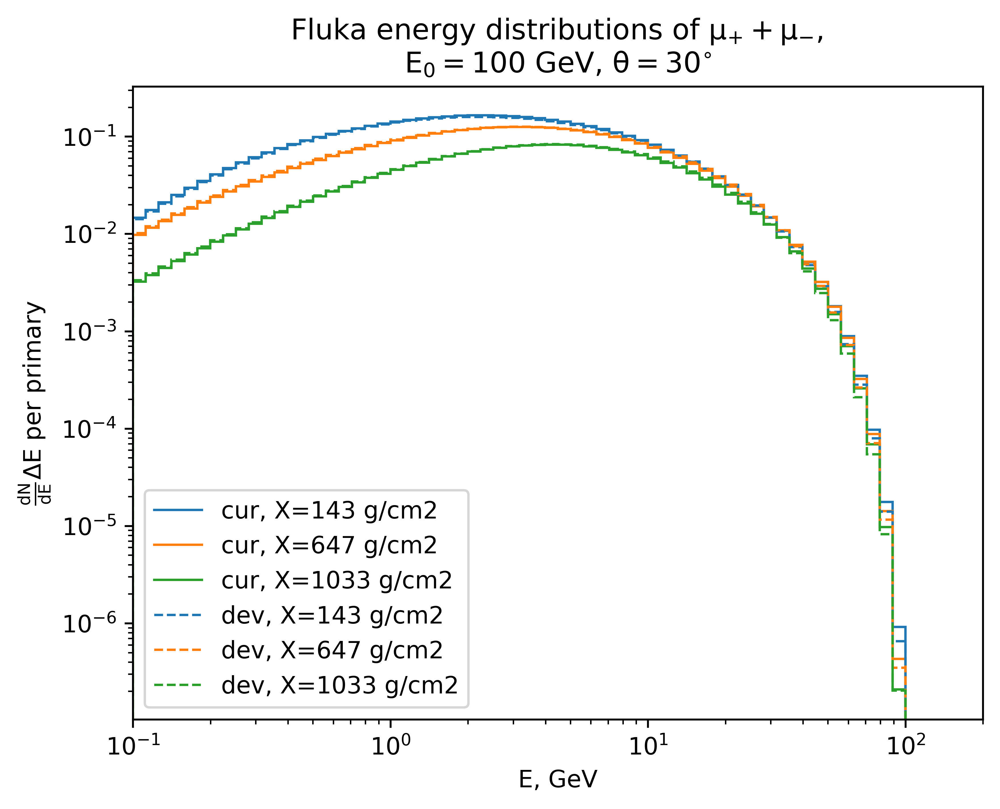

In [15]:
# Fluka energy distributions

line_colors = []
for ixdepth in range(3):
    fl_hist_en = fluka_hist_en["current"][ixdepth]
    line = plt.stairs(fl_hist_en[1], fl_hist_en[0], label = f"cur, X={fl_hist_en[3]} g/cm2")
    line_colors.append(line.get_edgecolor())

for ixdepth in range(3):    
    fl_hist_en = fluka_hist_en["develop"][ixdepth]
    line = plt.stairs(fl_hist_en[1], fl_hist_en[0], 
                      label = f"dev, X={fl_hist_en[3]} g/cm2",
                      color = line_colors[ixdepth],
                      linestyle = "--")

plt.xscale("log")
plt.xlim(1e-1, 2e2)
plt.yscale("log")
plt.xlabel("E, GeV")
plt.ylabel(r"$\frac{dN}{dE}\Delta E$ per primary")
plt.legend(loc = "lower left")   
plt.title(r"Fluka energy distributions of $\mu_{+} + \mu_{-}$, " + "\n" + r"$E_{0}=100$ GeV, $\theta=30^{\circ}$")
plt.savefig(dir_for_figures/'fig01.png')

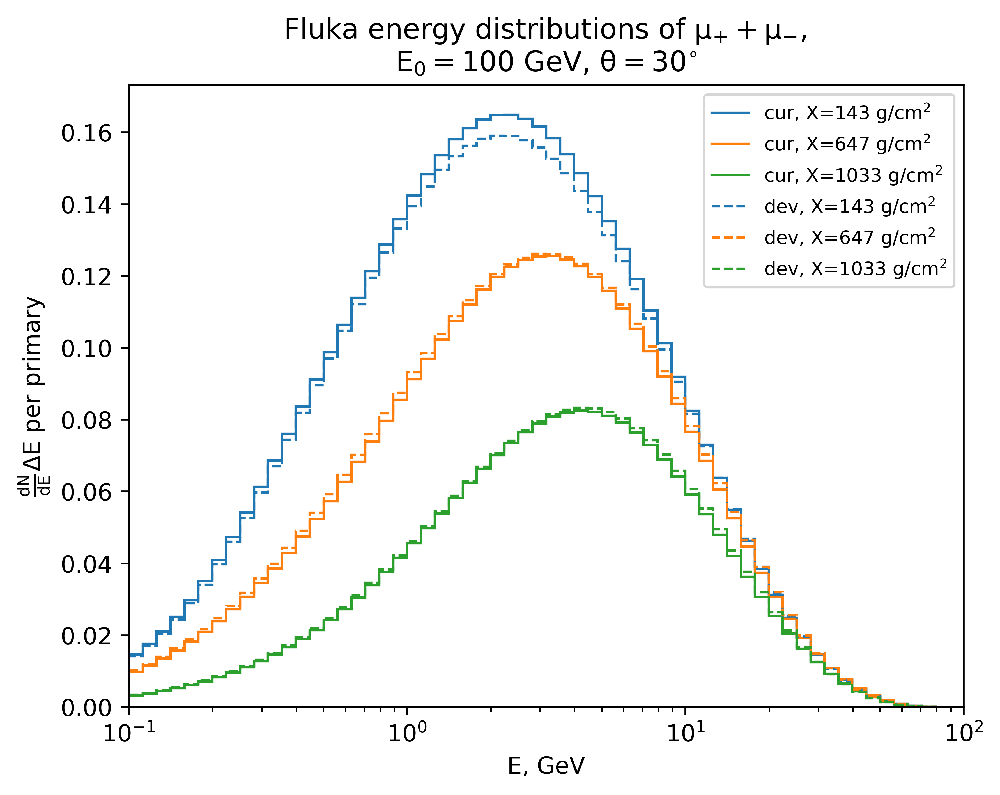

In [16]:
# Fluka energy distributions
params = {'mathtext.default': 'regular',
          'text.usetex': False}          
plt.rcParams.update(params)

line_colors = []
for ixdepth in range(3):
    fl_hist_en = fluka_hist_en["current"][ixdepth]
    line = plt.stairs(fl_hist_en[1], fl_hist_en[0], 
                      label = f"cur, X={fl_hist_en[3]} " + r"$g/cm^2$")
    line_colors.append(line.get_edgecolor())
    
    
for ixdepth in range(3):    
    fl_hist_en = fluka_hist_en["develop"][ixdepth]
    line = plt.stairs(fl_hist_en[1], fl_hist_en[0], 
                      label = f"dev, X={fl_hist_en[3]} " + r"$g/cm^2$",
                      color = line_colors[ixdepth],
                      linestyle = "--")

plt.xscale("log")
plt.xlim(1e-1, 1e2)
plt.xlabel("E, GeV")
plt.ylabel(r"$\frac{dN}{dE}\Delta E$ per primary")
plt.legend(loc = "upper right", fontsize = "8")   
plt.title(r"Fluka energy distributions of $\mu_{+} + \mu_{-}$, " + "\n" + r"$E_{0}=100$ GeV, $\theta=30^{\circ}$")
plt.savefig(dir_for_figures/'fig02.png')

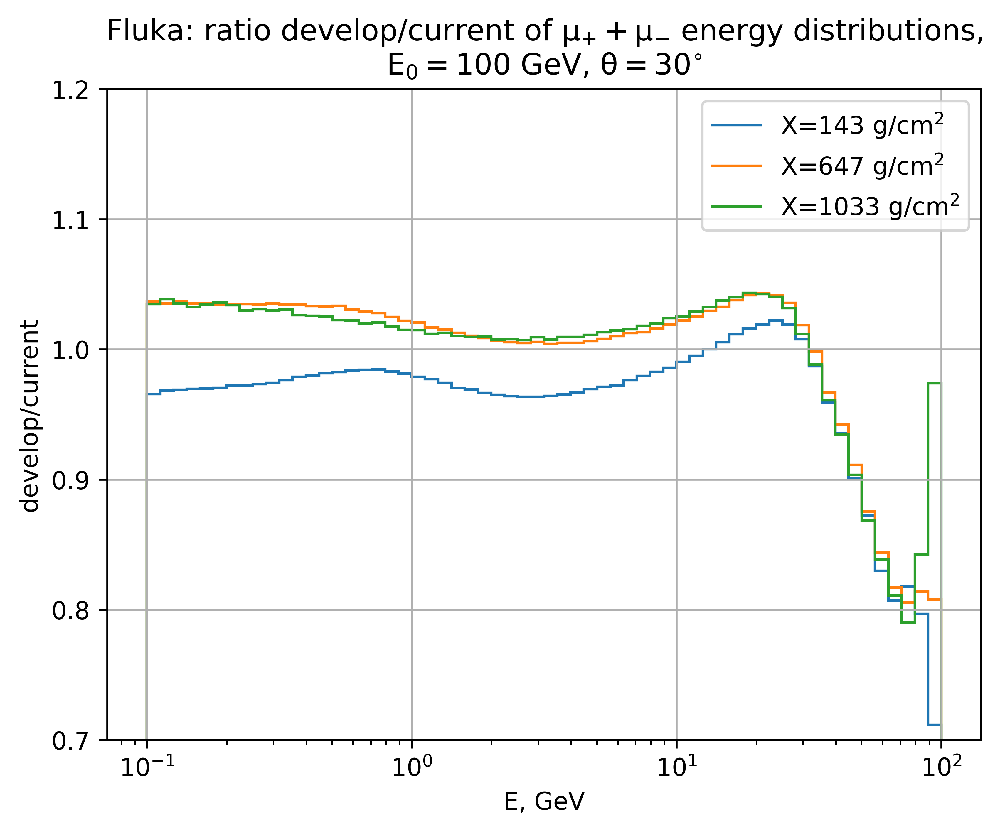

In [17]:
for ixdepth in range(3):
    fl_hist_en = fluka_hist_en["current"][ixdepth]
    # line = plt.stairs(fl_hist_en[1], fl_hist_en[0], label = f"fl:current X={fl_hist_en[3]} g/cm2")
    
    fl_hist_en1 = fluka_hist_en["develop"][ixdepth]
    plt.stairs(fl_hist_en1[1]/fl_hist_en[1], fl_hist_en1[0], 
                      label = f"X={fl_hist_en[3]} " + r"$g/cm^2$",
                    #   color = line.get_edgecolor(),
                    #   linestyle = "--"
                      )

plt.xscale("log")
# plt.yscale("log")
plt.xlabel("E, GeV")
plt.ylim(0.7, 1.2)
plt.ylabel(r"develop/current")
plt.legend()   
plt.grid()
plt.title(r"Fluka: ratio develop/current of $\mu_{+} + \mu_{-}$ energy distributions," + "\n" + r"$E_{0}=100$ GeV, $\theta=30^{\circ}$")
plt.savefig(dir_for_figures/'fig03.png')

# Fluka vs MCEq vs Corsika comparison

In [18]:
# Integrate over angles
angle_bins = np.deg2rad(np.linspace(0, 90, 2))
energy_bins = fluka_energy_bins_en
mceq_hists_en = mceq_dists.histograms(energy_bins, angle_bins)

  0%|          | 0/3 [00:00<?, ?it/s]

Particle 12, slant depth = 143
Particle 12, slant depth = 647
Particle 12, slant depth = 1033


 33%|███▎      | 1/3 [00:10<00:21, 10.73s/it]

Particle 13, slant depth = 143


/hetghome/antonpr/miniconda3/envs/env_impy/lib/python3.9/site-packages/scipy/integrate/_quadpack_py.py:1225: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,


Particle 13, slant depth = 647
Particle 13, slant depth = 1033


 67%|██████▋   | 2/3 [00:23<00:11, 11.90s/it]

Particle 14, slant depth = 143
Particle 14, slant depth = 647
Particle 14, slant depth = 1033


100%|██████████| 3/3 [00:44<00:00, 14.99s/it]


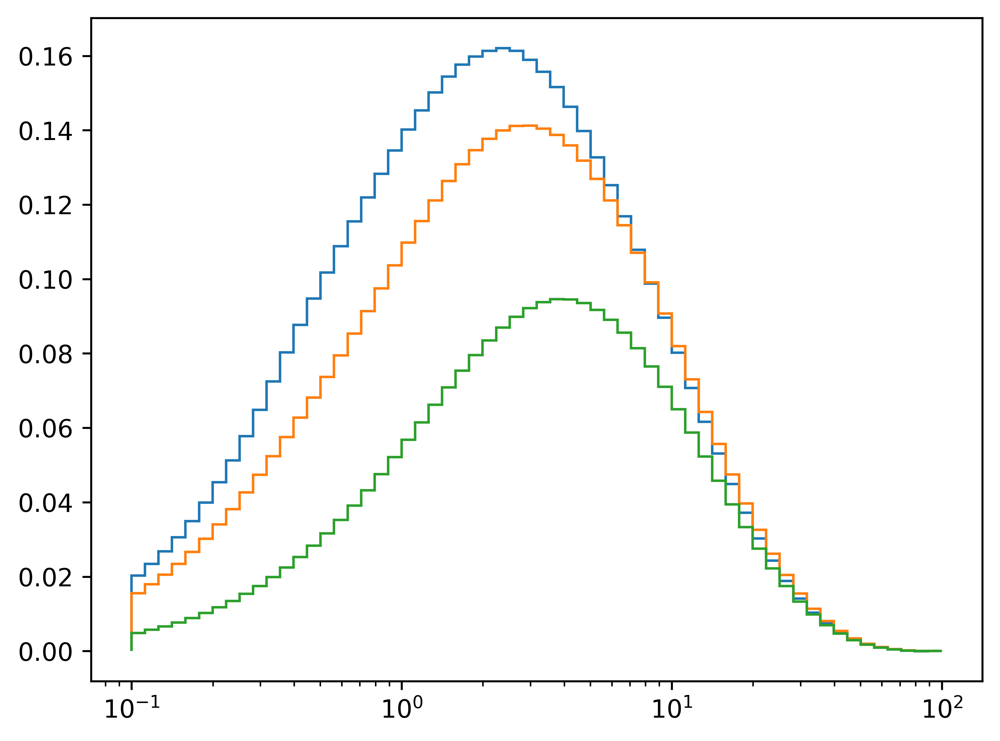

In [19]:
# Test plot
for xdepth in [143, 647, 1033]:
    plt.stairs(mceq_hists_en[13][xdepth]["hist_en_ang"].T[0],
                mceq_hists_en[13][xdepth]["en_bins"])
        
plt.xscale("log")  

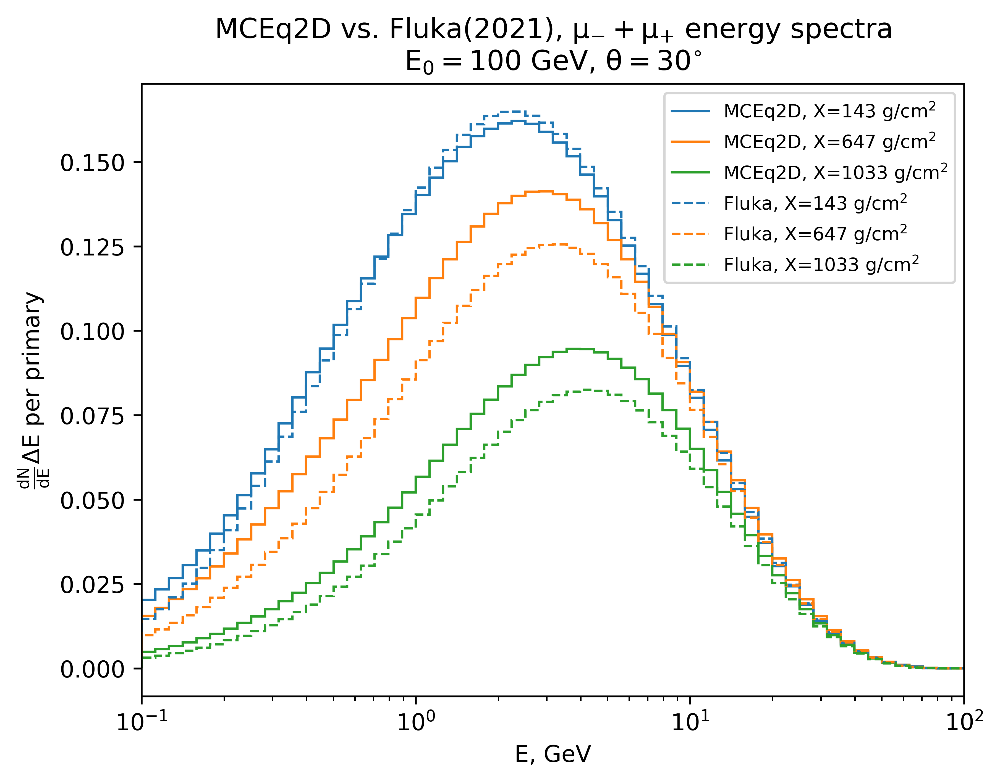

In [20]:
# for xdepth in [143, 647, 1033]:
#     plt.stairs(mceq_hists[13][xdepth]["hist_en_ang"].T[0],
#                 mceq_hists[13][xdepth]["en_bins"], label = f"MCEq, X={xdepth}")
xdepth_list = [143, 647, 1033]

line_colors = []
for ixdepth in range(3):
    
    line = plt.stairs(mceq_hists_en[13][xdepth_list[ixdepth]]["hist_en_ang"].T[0],
            mceq_hists_en[13][xdepth_list[ixdepth]]["en_bins"], 
            label = f"MCEq2D, X={xdepth_list[ixdepth]} " + r"$g/cm^2$",
            # color = line.get_edgecolor(),
                #   linestyle = "--"
                    )
    line_colors.append(line.get_edgecolor())
    
for ixdepth in range(3):    
    fl_hist_en = fluka_hist_en["current"][ixdepth]
    plt.stairs(fl_hist_en[1], fl_hist_en[0], 
                      label = f"Fluka, X={fl_hist_en[3]} " + r"$g/cm^2$",
                      color = line_colors[ixdepth],
                      linestyle = "--")

    
    # fl_hist_en = corsika_en_dist[ixdepth]
    # plt.stairs(fl_hist_en[0], fl_hist_en[1], 
    #                   label = f"corsika {fl_hist_en[3]} g/cm2",
    #                   color = line.get_edgecolor(),
    #                   linestyle = ":"
    #                   )

plt.xscale("log")
plt.xlim(1e-1, 1e2)
# plt.yscale("log")
plt.xlabel("E, GeV")
plt.ylabel(r"$\frac{dN}{dE}\Delta E$ per primary")
plt.legend(fontsize="8")   
plt.title(r"MCEq2D vs. Fluka(2021), $\mu_{-} + \mu_{+}$ energy spectra" + "\n"
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$")
plt.savefig(dir_for_figures/'fig04.png')

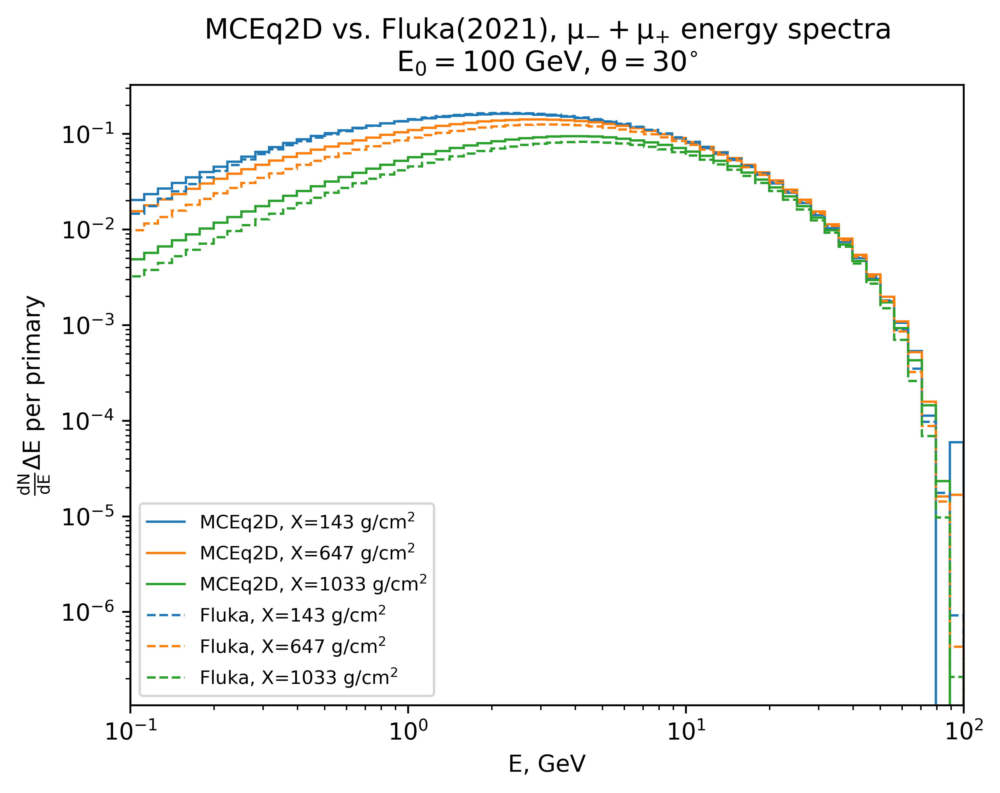

In [21]:
xdepth_list = [143, 647, 1033]

line_colors = []
for ixdepth in range(3):
    
    line = plt.stairs(mceq_hists_en[13][xdepth_list[ixdepth]]["hist_en_ang"].T[0],
            mceq_hists_en[13][xdepth_list[ixdepth]]["en_bins"], 
            label = f"MCEq2D, X={xdepth_list[ixdepth]} " + r"$g/cm^2$",
            # color = line.get_edgecolor(),
                #   linestyle = "--"
                    )
    line_colors.append(line.get_edgecolor())
    
for ixdepth in range(3):    
    fl_hist_en = fluka_hist_en["current"][ixdepth]
    plt.stairs(fl_hist_en[1], fl_hist_en[0], 
                      label = f"Fluka, X={fl_hist_en[3]} " + r"$g/cm^2$",
                      color = line_colors[ixdepth],
                      linestyle = "--")

    
    # fl_hist_en = corsika_en_dist[ixdepth]
    # plt.stairs(fl_hist_en[0], fl_hist_en[1], 
    #                   label = f"corsika {fl_hist_en[3]} g/cm2",
    #                   color = line.get_edgecolor(),
    #                   linestyle = ":"
    #                   )

plt.xscale("log")
plt.xlim(1e-1, 1e2)
plt.yscale("log")
plt.xlabel("E, GeV")
plt.ylabel(r"$\frac{dN}{dE}\Delta E$ per primary")
plt.legend(fontsize="8")   
plt.title(r"MCEq2D vs. Fluka(2021), $\mu_{-} + \mu_{+}$ energy spectra" + "\n"
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$")
plt.savefig(dir_for_figures/'fig05.png')

/tmp/ipykernel_3389245/4205147384.py:18: RuntimeWarning: divide by zero encountered in divide
  plt.stairs(fl_hist_en[1]/mceq_curr, fl_hist_en[0],


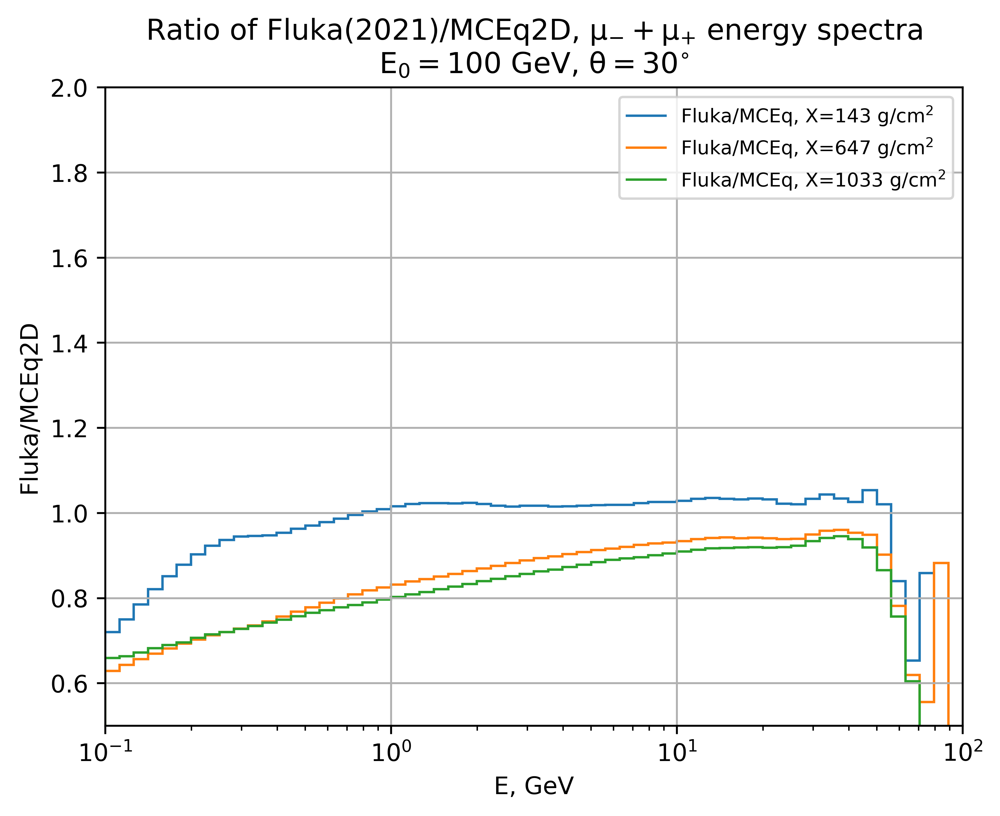

In [22]:
xdepth_list = [143, 647, 1033]

line_colors = []
# for ixdepth in range(3):
    
    # line = plt.stairs(mceq_hists_en[13][xdepth_list[ixdepth]]["hist_en_ang"].T[0],
    #         mceq_hists_en[13][xdepth_list[ixdepth]]["en_bins"], 
    #         label = f"MCEq2D, X={xdepth_list[ixdepth]} " + r"$g/cm^2$",
    #         # color = line.get_edgecolor(),
    #             #   linestyle = "--"
    #                 )
    # line_colors.append(line.get_edgecolor())
    
for ixdepth in range(3):
    mceq_curr = mceq_hists_en[13][xdepth_list[ixdepth]]["hist_en_ang"].T[0]
    mceq_curr[mceq_curr < 0] = 0 
    fl_hist_en = fluka_hist_en["current"][ixdepth]
    plt.stairs(fl_hist_en[1]/mceq_curr, fl_hist_en[0], 
                      label = f"Fluka/MCEq, X={fl_hist_en[3]} " + r"$g/cm^2$",
                    #   color = line_colors[ixdepth],
                    #   linestyle = "--"
                      )

    
    # fl_hist_en = corsika_en_dist[ixdepth]
    # plt.stairs(fl_hist_en[0], fl_hist_en[1], 
    #                   label = f"corsika {fl_hist_en[3]} g/cm2",
    #                   color = line.get_edgecolor(),
    #                   linestyle = ":"
    #                   )

plt.xscale("log")
plt.xlim(1e-1, 1e2)
# plt.yscale("log")
plt.grid()
plt.xlabel("E, GeV")
plt.ylim(0.5, 2)
plt.ylabel(r"Fluka/MCEq2D")
plt.legend(fontsize="8")   
plt.title(r"Ratio of Fluka(2021)/MCEq2D, $\mu_{-} + \mu_{+}$ energy spectra" + "\n"
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$")


plt.savefig(dir_for_figures/'fig06.png')

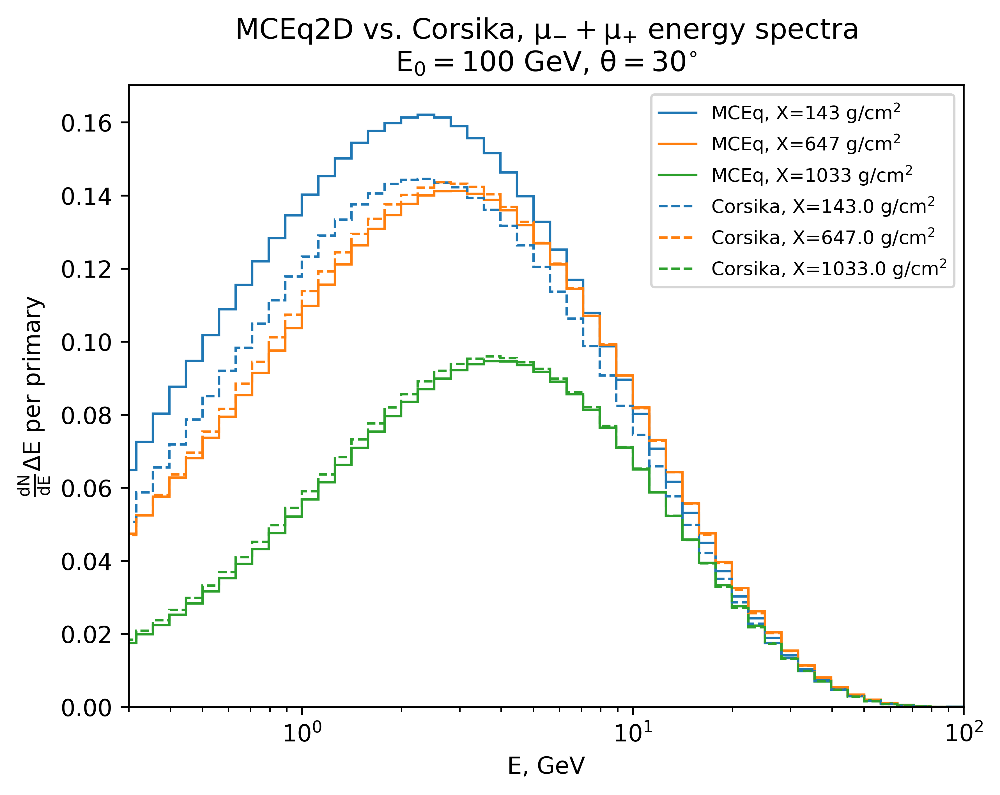

In [23]:

xdepth_list = [143, 647, 1033]

line_colors = []

# MCEq
for ixdepth in range(3):
  line = plt.stairs(mceq_hists_en[13][xdepth_list[ixdepth]]["hist_en_ang"].T[0],
              mceq_hists_en[13][xdepth_list[ixdepth]]["en_bins"], 
              label = f"MCEq, X={xdepth_list[ixdepth]} " + r"$g/cm^2$")
  
  line_colors.append(line.get_edgecolor())
  
# Corsika
for ixdepth in range(3):    
    fl_hist_en = corsika_en_dist[ixdepth]
    plt.stairs(fl_hist_en[0], fl_hist_en[1], 
                      label = f"Corsika, {fl_hist_en[3]} " + r"$g/cm^2$",
                      color = line_colors[ixdepth],
                      linestyle = "--")

plt.xscale("log")
plt.xlim(3e-1, 1e2)
# plt.yscale("log")
plt.xlabel("E, GeV")
plt.ylabel(r"$\frac{dN}{dE}\Delta E$ per primary")
plt.legend(fontsize="8")   
plt.title(r"MCEq2D vs. Corsika, $\mu_{-} + \mu_{+}$ energy spectra" + "\n"
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$")
plt.savefig(dir_for_figures/'fig07.png')

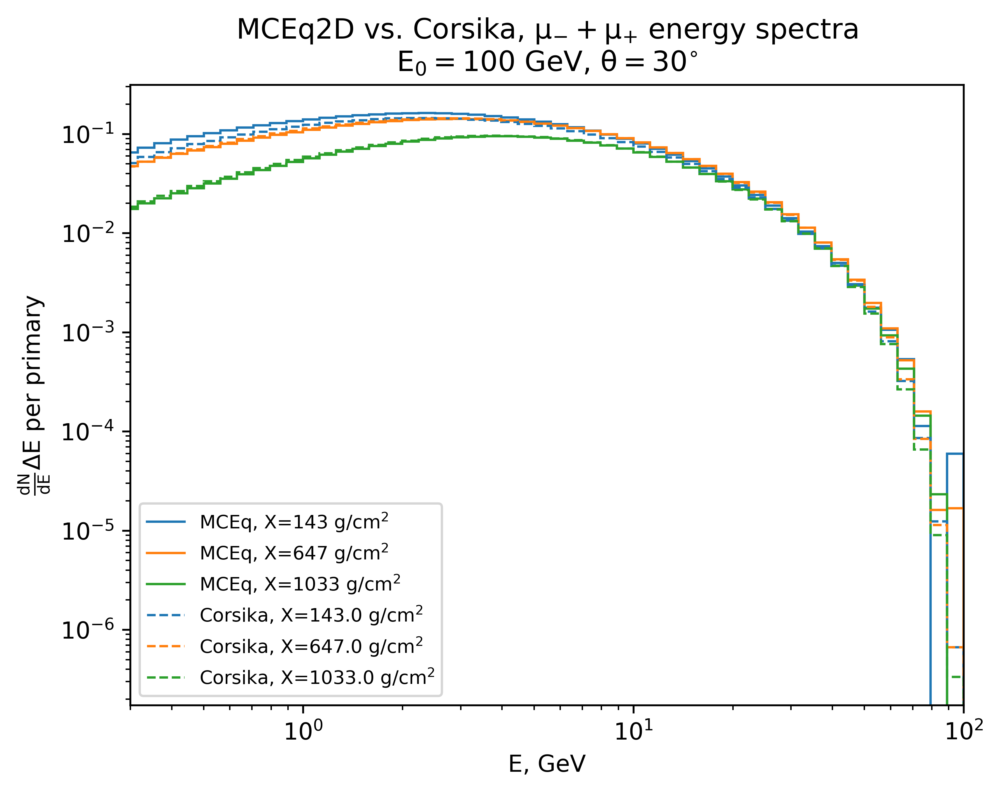

In [24]:
xdepth_list = [143, 647, 1033]

line_colors = []

# MCEq
for ixdepth in range(3):
  line = plt.stairs(mceq_hists_en[13][xdepth_list[ixdepth]]["hist_en_ang"].T[0],
              mceq_hists_en[13][xdepth_list[ixdepth]]["en_bins"], 
              label = f"MCEq, X={xdepth_list[ixdepth]} " + r"$g/cm^2$")
  
  line_colors.append(line.get_edgecolor())
  
# Corsika
for ixdepth in range(3):    
    fl_hist_en = corsika_en_dist[ixdepth]
    plt.stairs(fl_hist_en[0], fl_hist_en[1], 
                      label = f"Corsika, {fl_hist_en[3]} " + r"$g/cm^2$",
                      color = line_colors[ixdepth],
                      linestyle = "--")

plt.xscale("log")
plt.xlim(3e-1, 1e2)
plt.yscale("log")
plt.xlabel("E, GeV")
plt.ylabel(r"$\frac{dN}{dE}\Delta E$ per primary")
plt.legend(fontsize="8")   
plt.title(r"MCEq2D vs. Corsika, $\mu_{-} + \mu_{+}$ energy spectra" + "\n"
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$")
plt.savefig(dir_for_figures/'fig08.png')

/tmp/ipykernel_3389245/3378674770.py:8: RuntimeWarning: divide by zero encountered in divide
  line = plt.stairs(fl_hist_en[0]/mceq_hists_en[13][xdepth_list[ixdepth]]["hist_en_ang"].T[0],


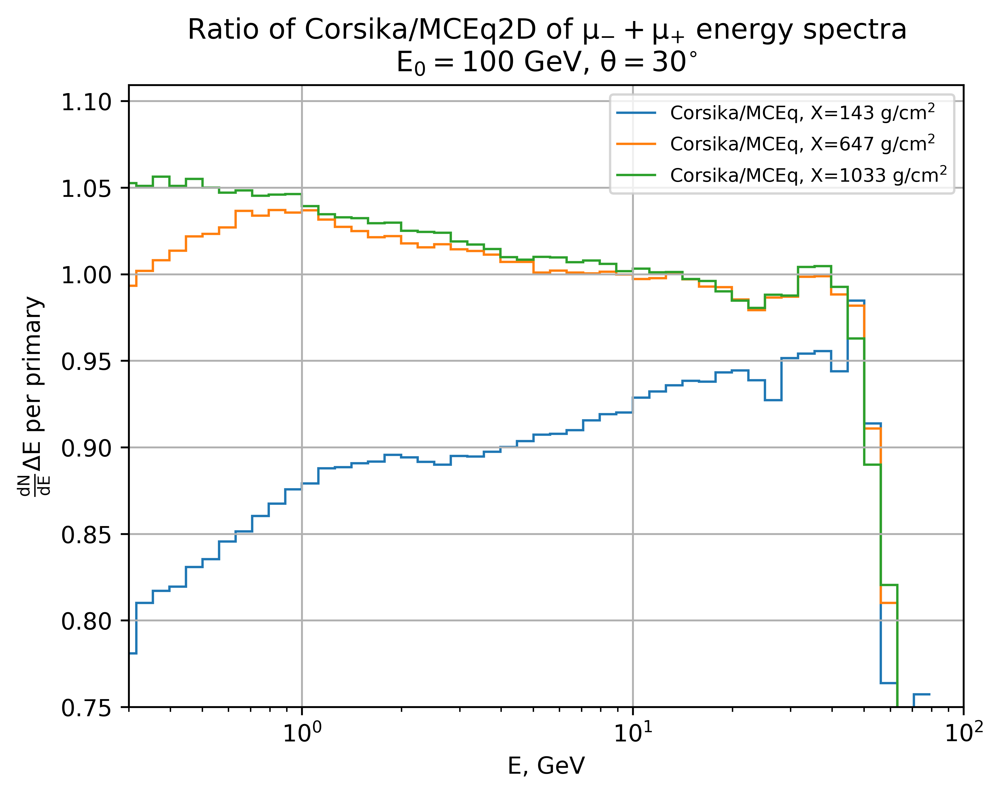

In [25]:
xdepth_list = [143, 647, 1033]

line_colors = []

# MCEq
for ixdepth in range(3):
  fl_hist_en = corsika_en_dist[ixdepth]
  line = plt.stairs(fl_hist_en[0]/mceq_hists_en[13][xdepth_list[ixdepth]]["hist_en_ang"].T[0],
              mceq_hists_en[13][xdepth_list[ixdepth]]["en_bins"], 
              label = f"Corsika/MCEq, X={xdepth_list[ixdepth]} " + r"$g/cm^2$")
  
  line_colors.append(line.get_edgecolor())
  
# Corsika
# for ixdepth in range(3):    
#     fl_hist_en = corsika_en_dist[ixdepth]
#     plt.stairs(fl_hist_en[0], fl_hist_en[1], 
#                       label = f"Corsika, {fl_hist_en[3]} " + r"$g/cm^2$",
#                       color = line_colors[ixdepth],
#                       linestyle = "--")

plt.xscale("log")
plt.xlim(3e-1, 1e2)
plt.ylim(0.75)
# plt.yscale("log")
plt.xlabel("E, GeV")
plt.ylabel(r"$\frac{dN}{dE}\Delta E$ per primary")
plt.legend(fontsize="8")   
plt.title(r"Ratio of Corsika/MCEq2D of $\mu_{-} + \mu_{+}$ energy spectra" + "\n"
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$")
plt.grid()
plt.savefig(dir_for_figures/'fig09.png')

# Anglular distributions

In [26]:
# Get MCEq histogram
angle_bins = fluka_ang_bins
energy_bins = [1, 1.3, 2, 2.5, 4, 5]
mceq_hists_ang = mceq_dists.histograms(energy_bins, angle_bins)

  0%|          | 0/3 [00:00<?, ?it/s]

Particle 12, slant depth = 143
Particle 12, slant depth = 647
Particle 12, slant depth = 1033


 33%|███▎      | 1/3 [00:05<00:11,  5.92s/it]

Particle 13, slant depth = 143
Particle 13, slant depth = 647
Particle 13, slant depth = 1033


 67%|██████▋   | 2/3 [00:10<00:05,  5.30s/it]

Particle 14, slant depth = 143
Particle 14, slant depth = 647
Particle 14, slant depth = 1033


100%|██████████| 3/3 [00:17<00:00,  5.78s/it]


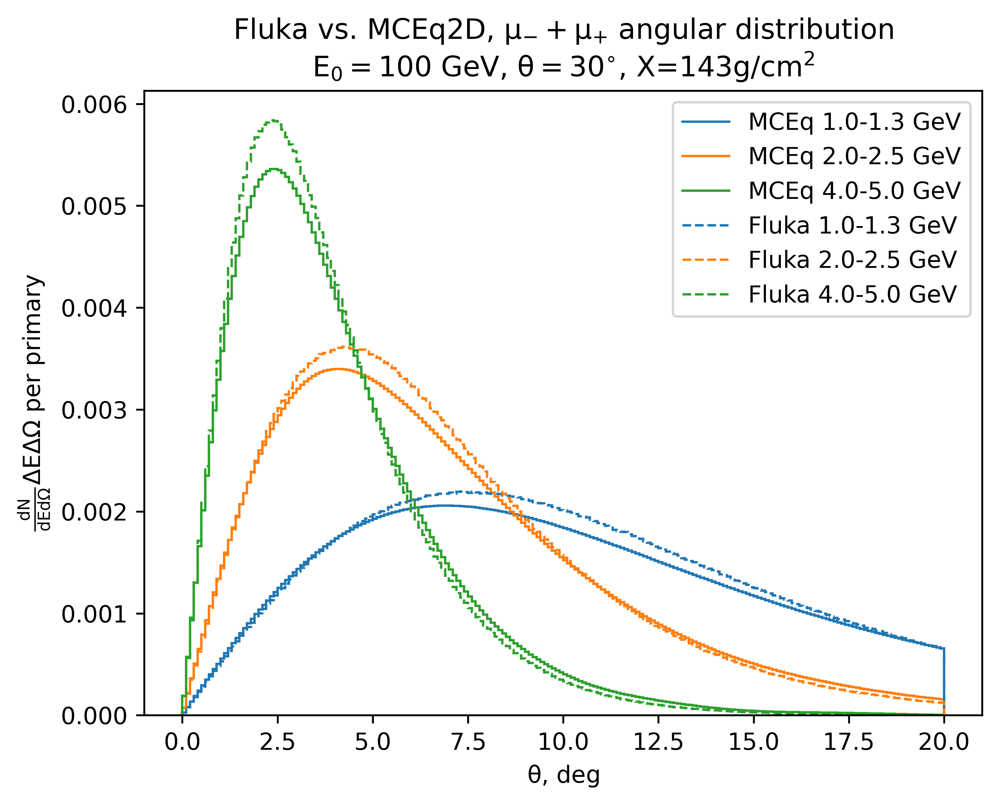

In [27]:
xdepth = 143
line_colors = []
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        
        
for ixdepth in range(3):
    for ienergy in range(3):
        if (ienergy in [0, 1, 2]) and (ixdepth in [0]):
            fl_dist = fluka_hist["current"][ixdepth][ienergy]
            line = plt.stairs(fl_dist[1], np.rad2deg(fl_dist[0]),
                    label = f"Fluka {fl_dist[4]} GeV",
                    color = line_colors[ienergy],
                    linestyle = "--")      
        
        
plt.title(r"Fluka vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
# plt.yscale("log")
# plt.xlim(0.08, 0.1)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/'fig10.png')

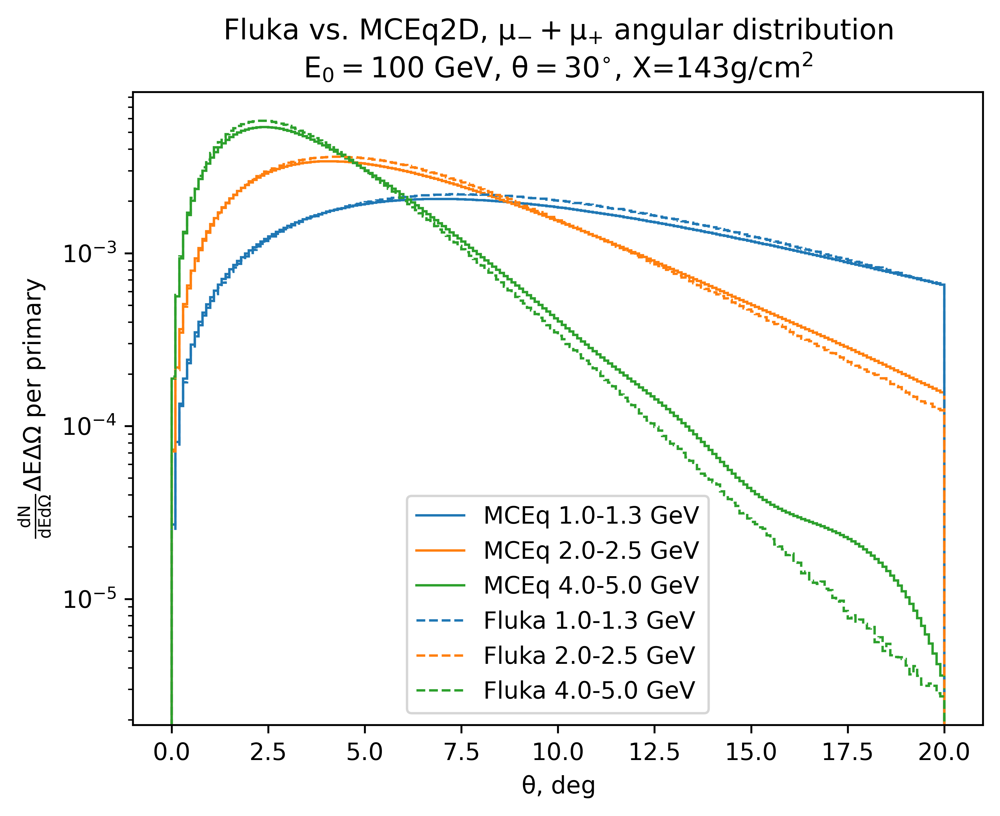

In [28]:
xdepth = 143
line_colors = []
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        
        
for ixdepth in range(3):
    for ienergy in range(3):
        if (ienergy in [0, 1, 2]) and (ixdepth in [0]):
            fl_dist = fluka_hist["current"][ixdepth][ienergy]
            line = plt.stairs(fl_dist[1], np.rad2deg(fl_dist[0]),
                    label = f"Fluka {fl_dist[4]} GeV",
                    color = line_colors[ienergy],
                    linestyle = "--")      
        
        
plt.title(r"Fluka vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
plt.yscale("log")
# plt.xlim(0.08, 0.1)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/'fig11.png')

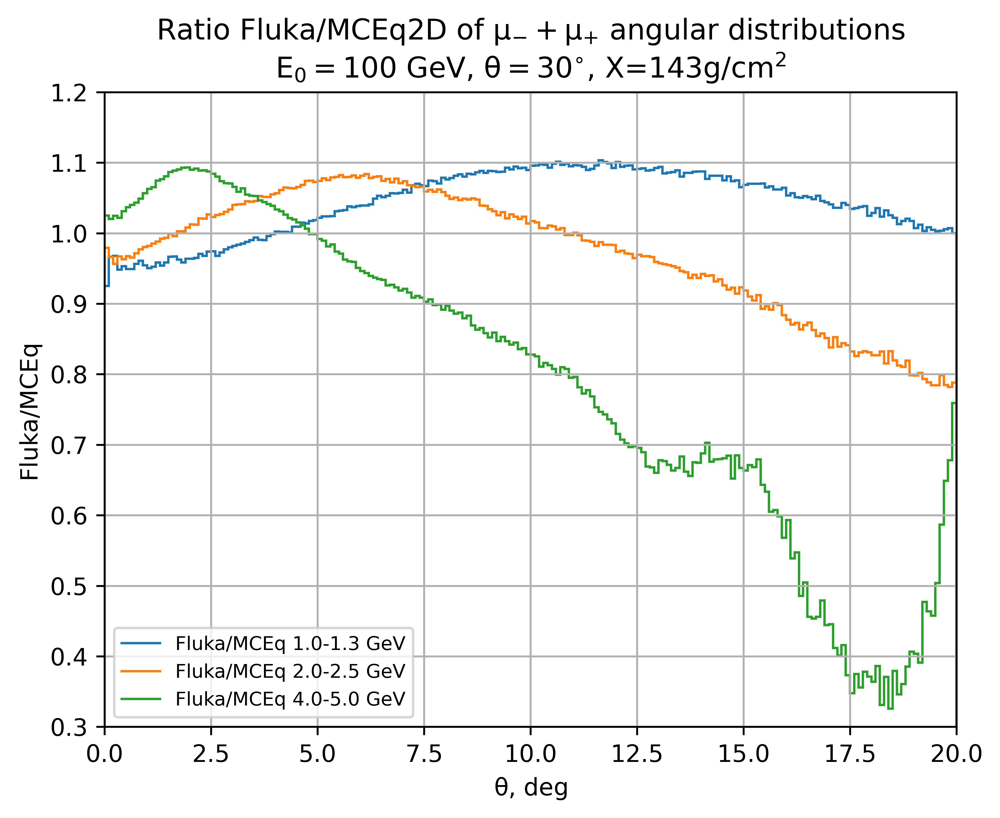

In [29]:
xdepth = 143
ixdepth = 0
line_colors = []
ienergy = 0
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        
        fl_dist = fluka_hist["current"][ixdepth][ienergy]
        ienergy += 1
        line = plt.stairs(fl_dist[1]/mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"Fluka/MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        
        
# for ixdepth in range(3):
#     for ienergy in range(3):
#         if (ienergy in [0, 1, 2]) and (ixdepth in [0]):
#             fl_dist = fluka_hist["current"][ixdepth][ienergy]
#             line = plt.stairs(fl_dist[1], np.rad2deg(fl_dist[0]),
#                     label = f"current: {fl_dist[4]} GeV",
#                     color = line_colors[ienergy],
#                     linestyle = "--")      
        
        
plt.title(r"Ratio Fluka/MCEq2D of $\mu_{-} + \mu_{+}$ angular distributions" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"Fluka/MCEq")
# plt.yscale("log")
plt.xlim(0, 20)
plt.ylim(0.3, 1.2)
plt.grid()
plt.legend(fontsize="8", loc = "best")  
plt.savefig(dir_for_figures/'fig12.png')

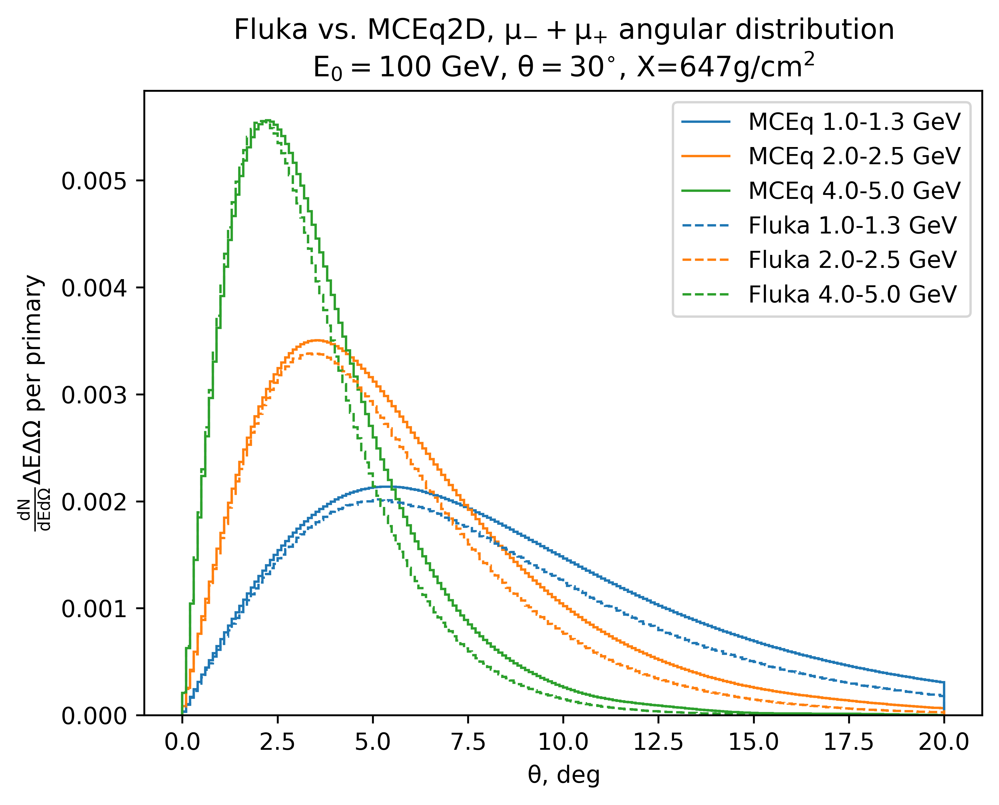

In [30]:
xdepth = 647
line_colors = []
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        
        
for ixdepth in range(3):
    for ienergy in range(3):
        if (ienergy in [0, 1, 2]) and (ixdepth in [1]):
            fl_dist = fluka_hist["current"][ixdepth][ienergy]
            line = plt.stairs(fl_dist[1], np.rad2deg(fl_dist[0]),
                    label = f"Fluka {fl_dist[4]} GeV",
                    color = line_colors[ienergy],
                    linestyle = "--")      
        
        
plt.title(r"Fluka vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
# plt.yscale("log")
# plt.xlim(0.08, 0.1)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/'fig13.png')

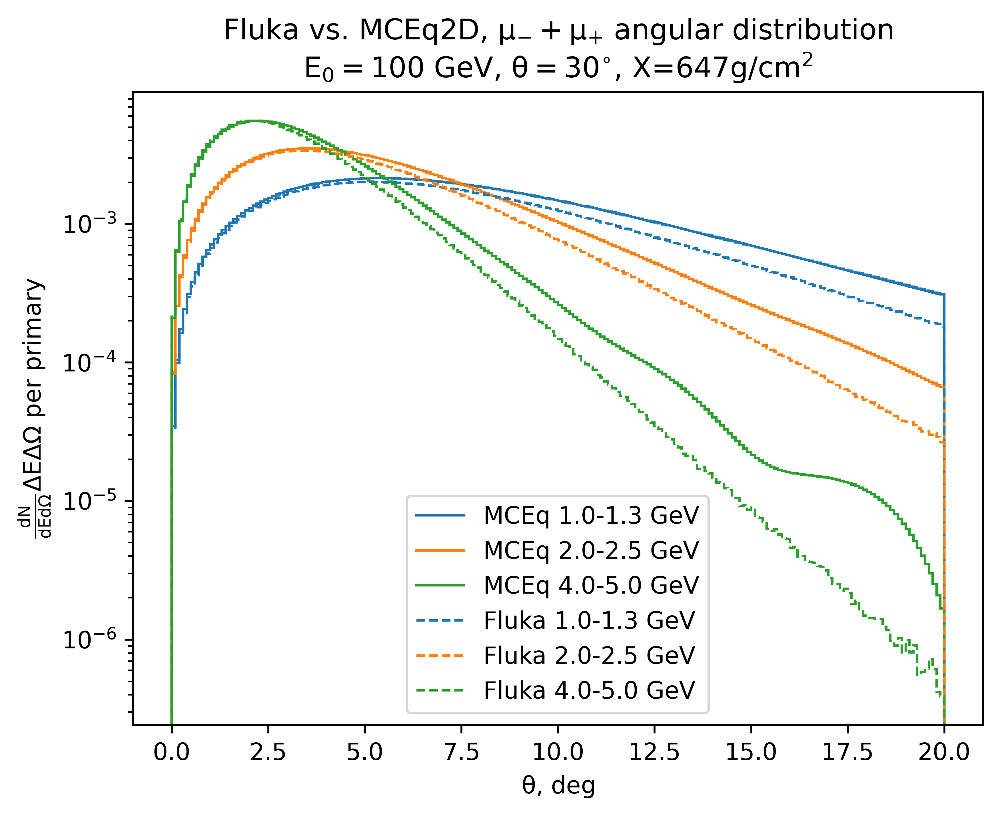

In [31]:
xdepth = 647
line_colors = []
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        
        
for ixdepth in range(3):
    for ienergy in range(3):
        if (ienergy in [0, 1, 2]) and (ixdepth in [1]):
            fl_dist = fluka_hist["current"][ixdepth][ienergy]
            line = plt.stairs(fl_dist[1], np.rad2deg(fl_dist[0]),
                    label = f"Fluka {fl_dist[4]} GeV",
                    color = line_colors[ienergy],
                    linestyle = "--")      
        
        
plt.title(r"Fluka vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
plt.yscale("log")
# plt.xlim(0.08, 0.1)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/'fig14.png')

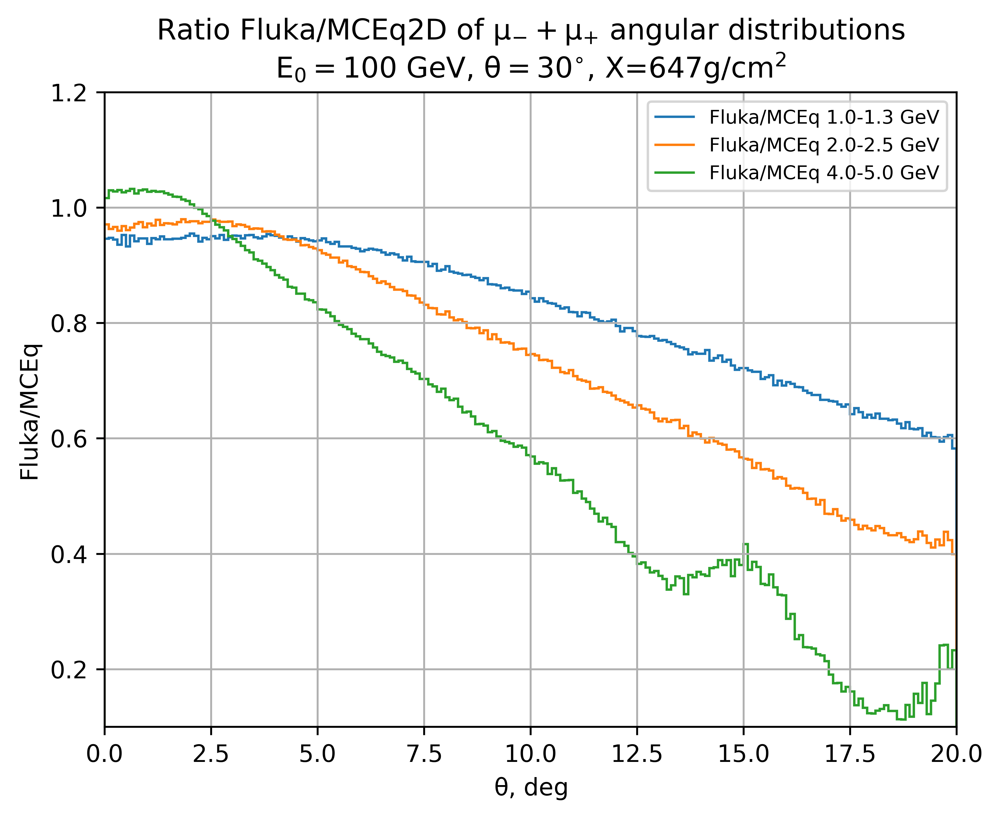

In [32]:
figure_name = "fig15.png"
xdepth = 647
ixdepth = 1
line_colors = []
ienergy = 0
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        
        fl_dist = fluka_hist["current"][ixdepth][ienergy]
        ienergy += 1
        line = plt.stairs(fl_dist[1]/mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"Fluka/MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        
        
# for ixdepth in range(3):
#     for ienergy in range(3):
#         if (ienergy in [0, 1, 2]) and (ixdepth in [0]):
#             fl_dist = fluka_hist["current"][ixdepth][ienergy]
#             line = plt.stairs(fl_dist[1], np.rad2deg(fl_dist[0]),
#                     label = f"current: {fl_dist[4]} GeV",
#                     color = line_colors[ienergy],
#                     linestyle = "--")      
        
        
plt.title(r"Ratio Fluka/MCEq2D of $\mu_{-} + \mu_{+}$ angular distributions" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"Fluka/MCEq")
# plt.yscale("log")
plt.xlim(0, 20)
plt.ylim(0.1, 1.2)
plt.grid()
plt.legend(fontsize="8", loc = "best")  
plt.savefig(dir_for_figures/figure_name)

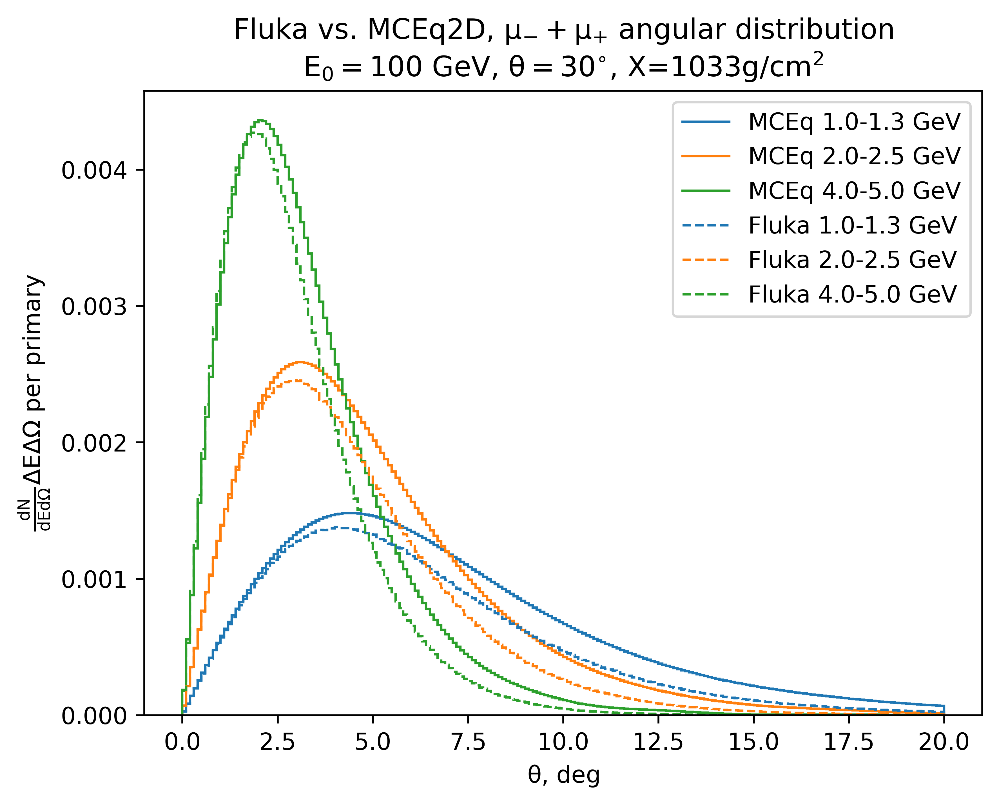

In [33]:
figure_name = "fig16.png"
xdepth = 1033
line_colors = []
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        
        
for ixdepth in range(3):
    for ienergy in range(3):
        if (ienergy in [0, 1, 2]) and (ixdepth in [2]):
            fl_dist = fluka_hist["current"][ixdepth][ienergy]
            line = plt.stairs(fl_dist[1], np.rad2deg(fl_dist[0]),
                    label = f"Fluka {fl_dist[4]} GeV",
                    color = line_colors[ienergy],
                    linestyle = "--")      
        
        
plt.title(r"Fluka vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
# plt.yscale("log")
# plt.xlim(0.08, 0.1)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

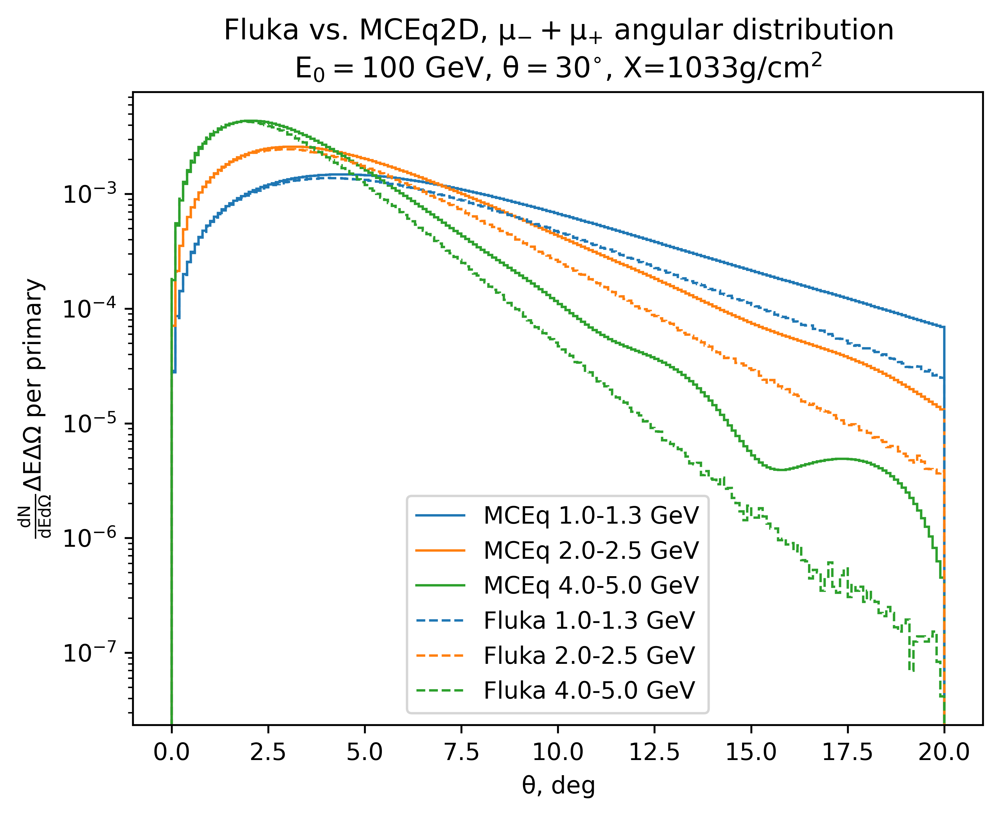

In [34]:
figure_name = "fig17.png"
xdepth = 1033
line_colors = []
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        
        
for ixdepth in range(3):
    for ienergy in range(3):
        if (ienergy in [0, 1, 2]) and (ixdepth in [2]):
            fl_dist = fluka_hist["current"][ixdepth][ienergy]
            line = plt.stairs(fl_dist[1], np.rad2deg(fl_dist[0]),
                    label = f"Fluka {fl_dist[4]} GeV",
                    color = line_colors[ienergy],
                    linestyle = "--")      
        
        
plt.title(r"Fluka vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
plt.yscale("log")
# plt.xlim(0.08, 0.1)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

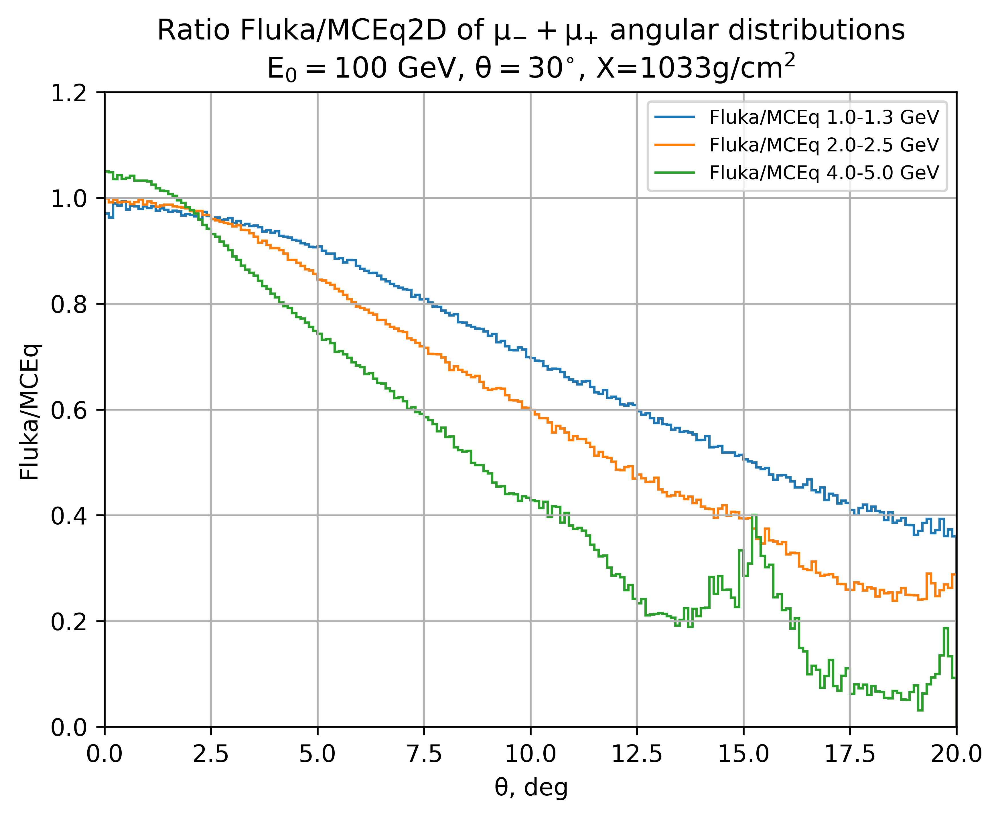

In [35]:
figure_name = "fig18.png"
xdepth = 1033
ixdepth = 2
line_colors = []
ienergy = 0
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        
        fl_dist = fluka_hist["current"][ixdepth][ienergy]
        ienergy += 1
        line = plt.stairs(fl_dist[1]/mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"Fluka/MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        
        
# for ixdepth in range(3):
#     for ienergy in range(3):
#         if (ienergy in [0, 1, 2]) and (ixdepth in [0]):
#             fl_dist = fluka_hist["current"][ixdepth][ienergy]
#             line = plt.stairs(fl_dist[1], np.rad2deg(fl_dist[0]),
#                     label = f"current: {fl_dist[4]} GeV",
#                     color = line_colors[ienergy],
#                     linestyle = "--")      
        
        
plt.title(r"Ratio Fluka/MCEq2D of $\mu_{-} + \mu_{+}$ angular distributions" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"Fluka/MCEq")
# plt.yscale("log")
plt.xlim(0, 20)
plt.ylim(0, 1.2)
plt.grid()
plt.legend(fontsize="8", loc = "best")  
plt.savefig(dir_for_figures/figure_name)

# Corsika vs MCEq with fluka bins

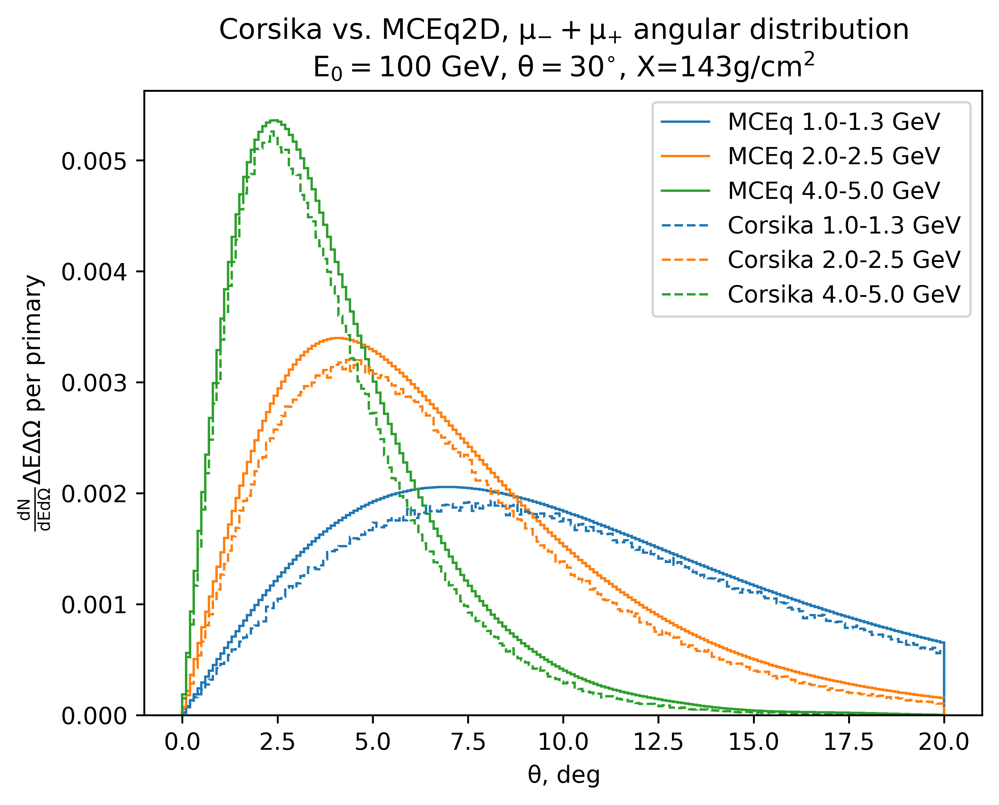

In [36]:
figure_name = "fig19.png"
xdepth = 143
ixdepth = 0
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)

icolor = 0
ienlabel = 0
for i, crs_comb_mu in enumerate(corsika_comb_mu[ixdepth]):
    if i in [0, 2, 4]: # Choose energy ranges to plot
        line = plt.stairs(crs_comb_mu[0], np.rad2deg(crs_comb_mu[1]), 
                          label = f"Corsika {en_labels[ienlabel]} GeV",
                          color = line_colors[icolor],
                          linestyle = "--")
        icolor += 1
        ienlabel += 1  
          
        
        
plt.title(r"Corsika vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
# plt.yscale("log")
# plt.xlim(0.08, 0.1)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

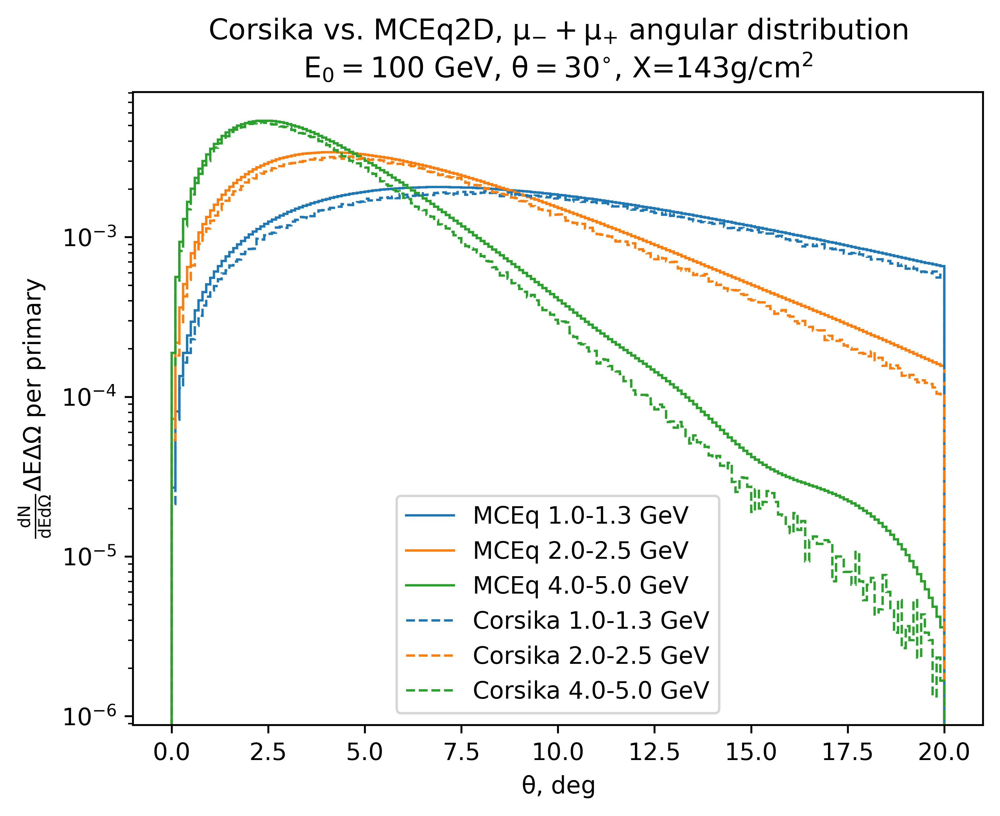

In [37]:
figure_name = "fig20.png"
xdepth = 143
ixdepth = 0
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)

icolor = 0
ienlabel = 0
for i, crs_comb_mu in enumerate(corsika_comb_mu[ixdepth]):
    if i in [0, 2, 4]: # Choose energy ranges to plot
        line = plt.stairs(crs_comb_mu[0], np.rad2deg(crs_comb_mu[1]), 
                          label = f"Corsika {en_labels[ienlabel]} GeV",
                          color = line_colors[icolor],
                          linestyle = "--")
        icolor += 1
        ienlabel += 1  
          
        
        
plt.title(r"Corsika vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
plt.yscale("log")
# plt.xlim(0.08, 0.1)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

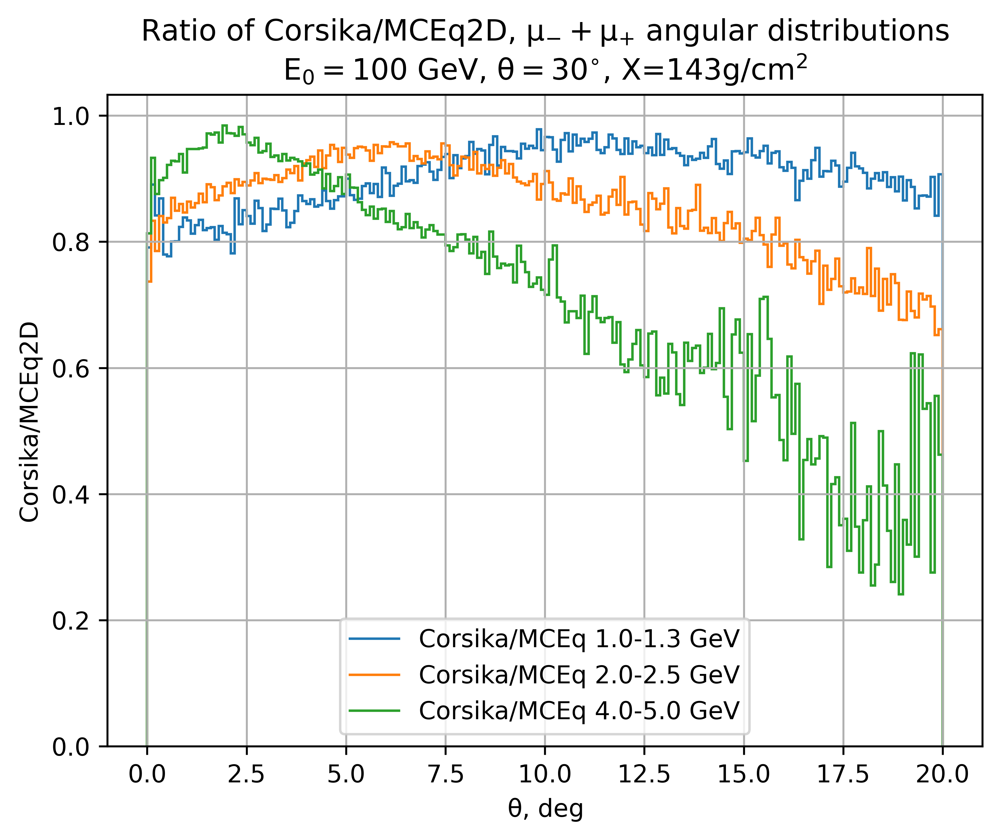

In [38]:
figure_name = "fig21.png"
xdepth = 143
ixdepth = 0
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(corsika_comb_mu[ixdepth][ind_energy][0]/mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"Corsika/MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)
        
        
plt.title(r"Ratio of Corsika/MCEq2D, $\mu_{-} + \mu_{+}$ angular distributions" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"Corsika/MCEq2D")
# plt.yscale("log")
# plt.xlim(0.08, 0.1)
# plt.ylim(20, 25)
plt.grid()
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

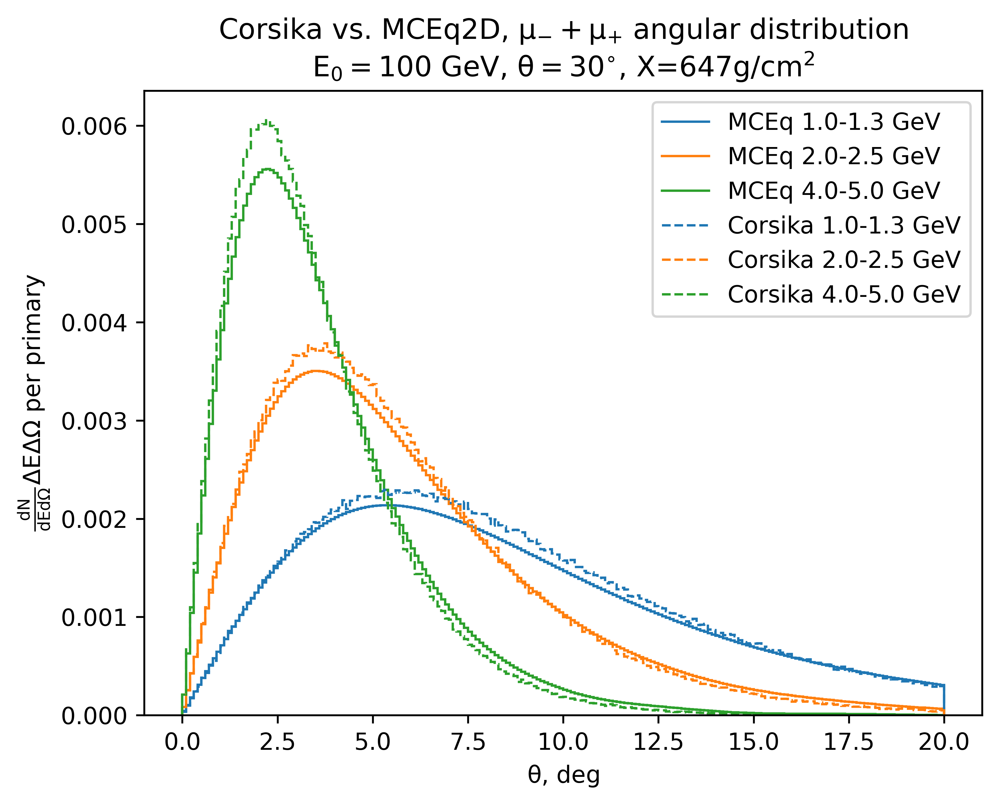

In [39]:
figure_name = "fig22.png"
xdepth = 647
ixdepth = 1
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)

icolor = 0
ienlabel = 0
for i, crs_comb_mu in enumerate(corsika_comb_mu[ixdepth]):
    if i in [0, 2, 4]: # Choose energy ranges to plot
        line = plt.stairs(crs_comb_mu[0], np.rad2deg(crs_comb_mu[1]), 
                          label = f"Corsika {en_labels[ienlabel]} GeV",
                          color = line_colors[icolor],
                          linestyle = "--")
        icolor += 1
        ienlabel += 1  
          
        
        
plt.title(r"Corsika vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
# plt.yscale("log")
# plt.xlim(0.08, 0.1)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

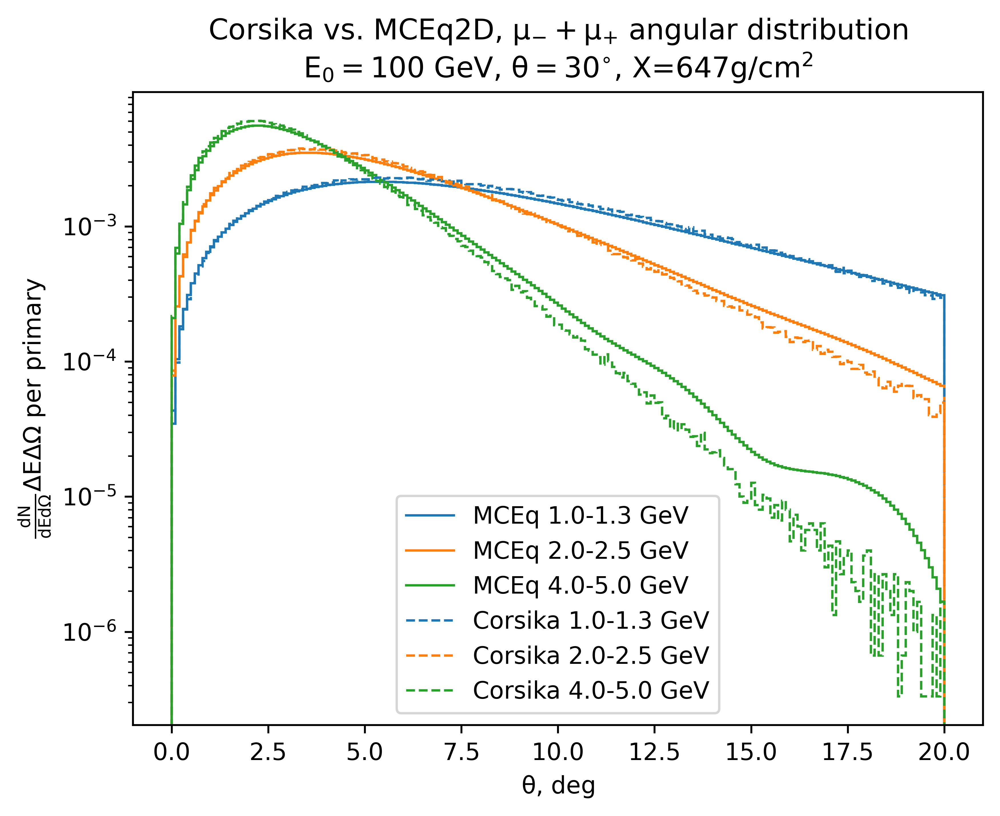

In [40]:
figure_name = "fig23.png"
xdepth = 647
ixdepth = 1
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)

icolor = 0
ienlabel = 0
for i, crs_comb_mu in enumerate(corsika_comb_mu[ixdepth]):
    if i in [0, 2, 4]: # Choose energy ranges to plot
        line = plt.stairs(crs_comb_mu[0], np.rad2deg(crs_comb_mu[1]), 
                          label = f"Corsika {en_labels[ienlabel]} GeV",
                          color = line_colors[icolor],
                          linestyle = "--")
        icolor += 1
        ienlabel += 1  
          
        
        
plt.title(r"Corsika vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
plt.yscale("log")
# plt.xlim(0.08, 0.1)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

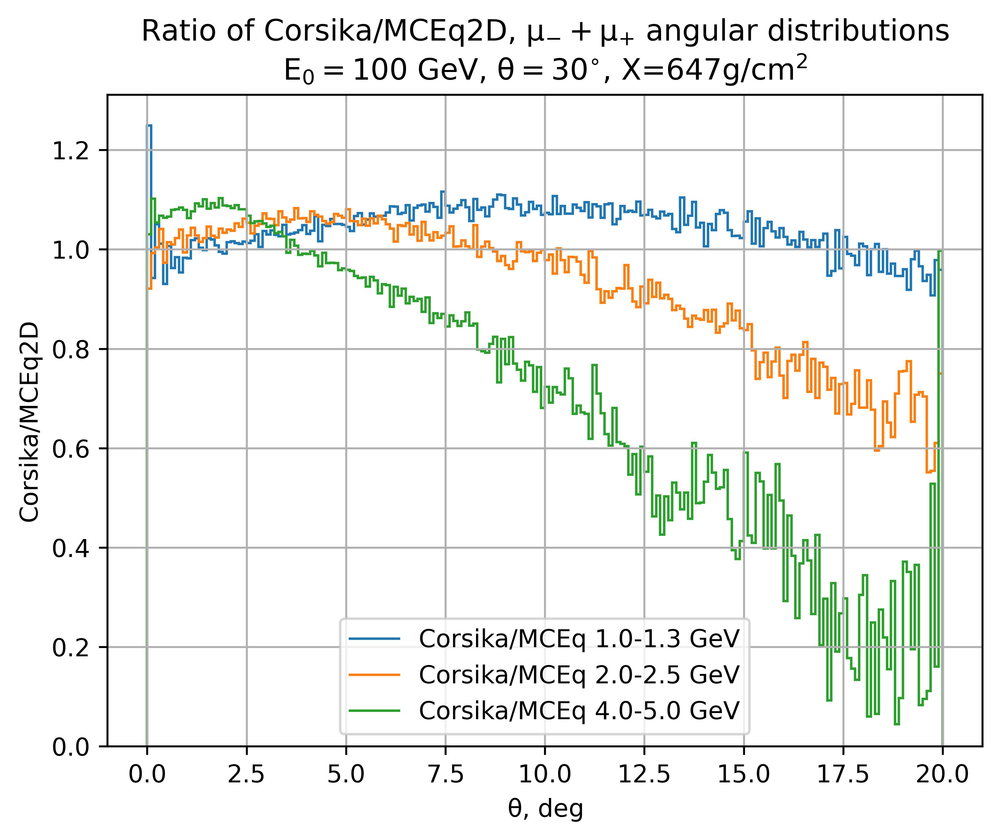

In [41]:
figure_name = "fig24.png"
xdepth = 647
ixdepth = 1
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(corsika_comb_mu[ixdepth][ind_energy][0]/mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"Corsika/MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)
        
        
plt.title(r"Ratio of Corsika/MCEq2D, $\mu_{-} + \mu_{+}$ angular distributions" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"Corsika/MCEq2D")
# plt.yscale("log")
# plt.xlim(0.08, 0.1)
# plt.ylim(20, 25)
plt.grid()
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

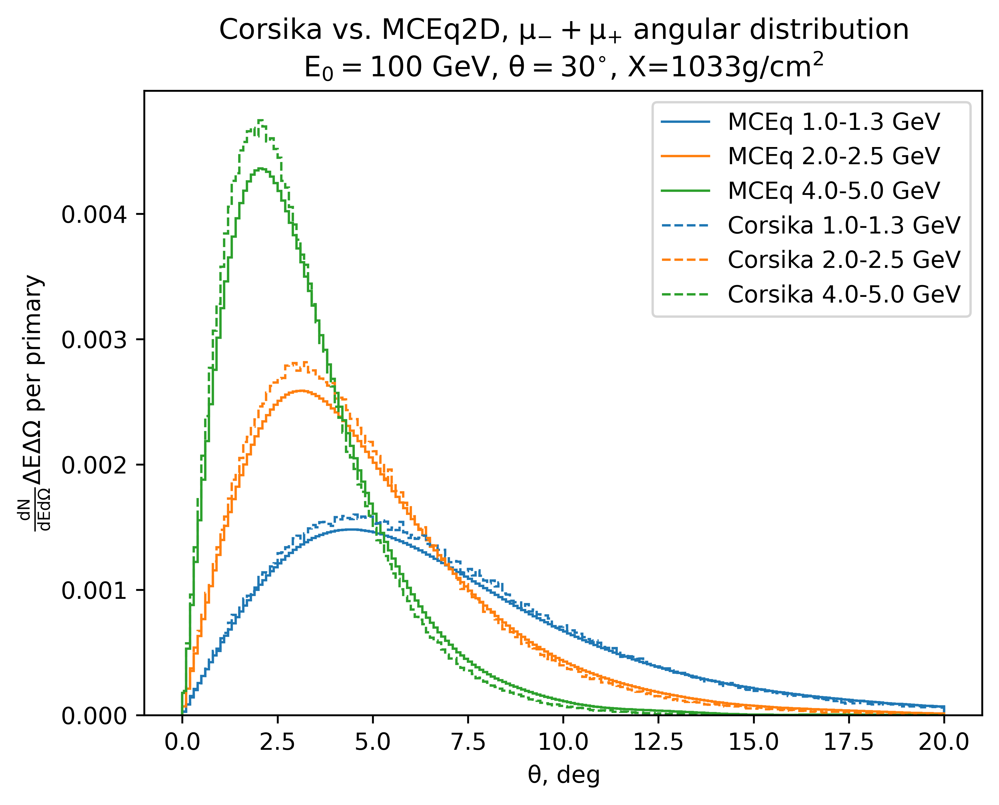

In [42]:
figure_name = "fig25.png"
xdepth = 1033
ixdepth = 2
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)

icolor = 0
ienlabel = 0
for i, crs_comb_mu in enumerate(corsika_comb_mu[ixdepth]):
    if i in [0, 2, 4]: # Choose energy ranges to plot
        line = plt.stairs(crs_comb_mu[0], np.rad2deg(crs_comb_mu[1]), 
                          label = f"Corsika {en_labels[ienlabel]} GeV",
                          color = line_colors[icolor],
                          linestyle = "--")
        icolor += 1
        ienlabel += 1  
          
        
        
plt.title(r"Corsika vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
# plt.yscale("log")
# plt.xlim(0.08, 0.1)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

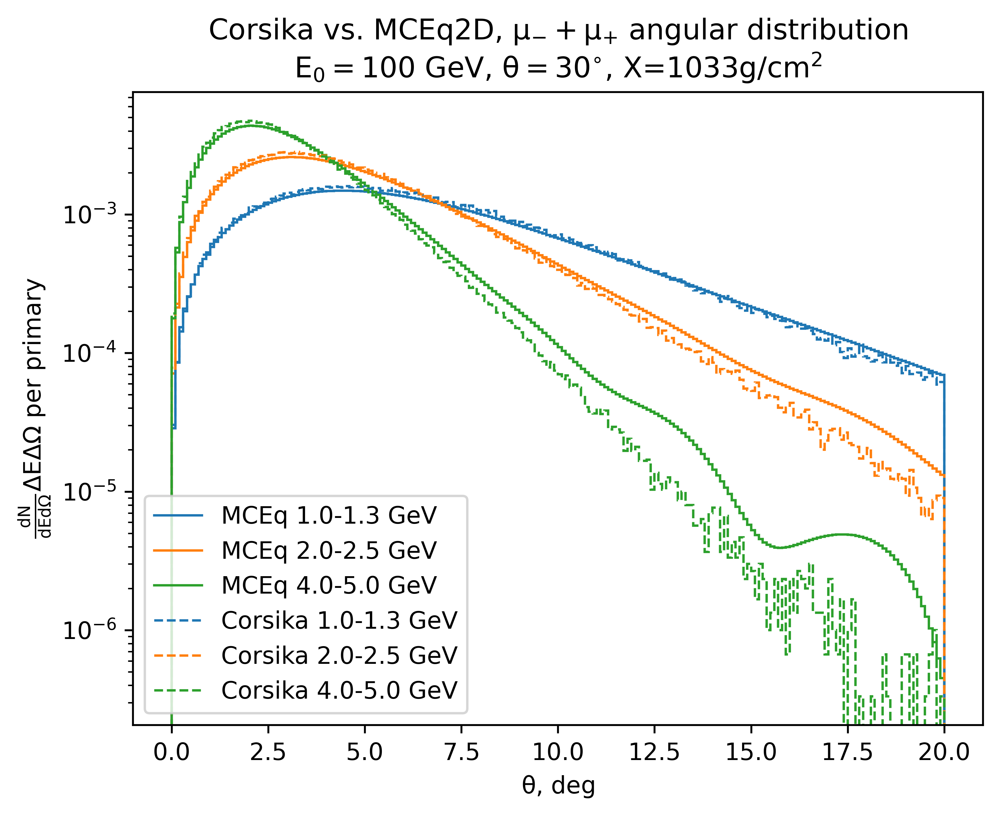

In [43]:
figure_name = "fig26.png"
xdepth = 1033
ixdepth = 2
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)

icolor = 0
ienlabel = 0
for i, crs_comb_mu in enumerate(corsika_comb_mu[ixdepth]):
    if i in [0, 2, 4]: # Choose energy ranges to plot
        line = plt.stairs(crs_comb_mu[0], np.rad2deg(crs_comb_mu[1]), 
                          label = f"Corsika {en_labels[ienlabel]} GeV",
                          color = line_colors[icolor],
                          linestyle = "--")
        icolor += 1
        ienlabel += 1  
          
        
        
plt.title(r"Corsika vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
plt.yscale("log")
# plt.xlim(0.08, 0.1)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

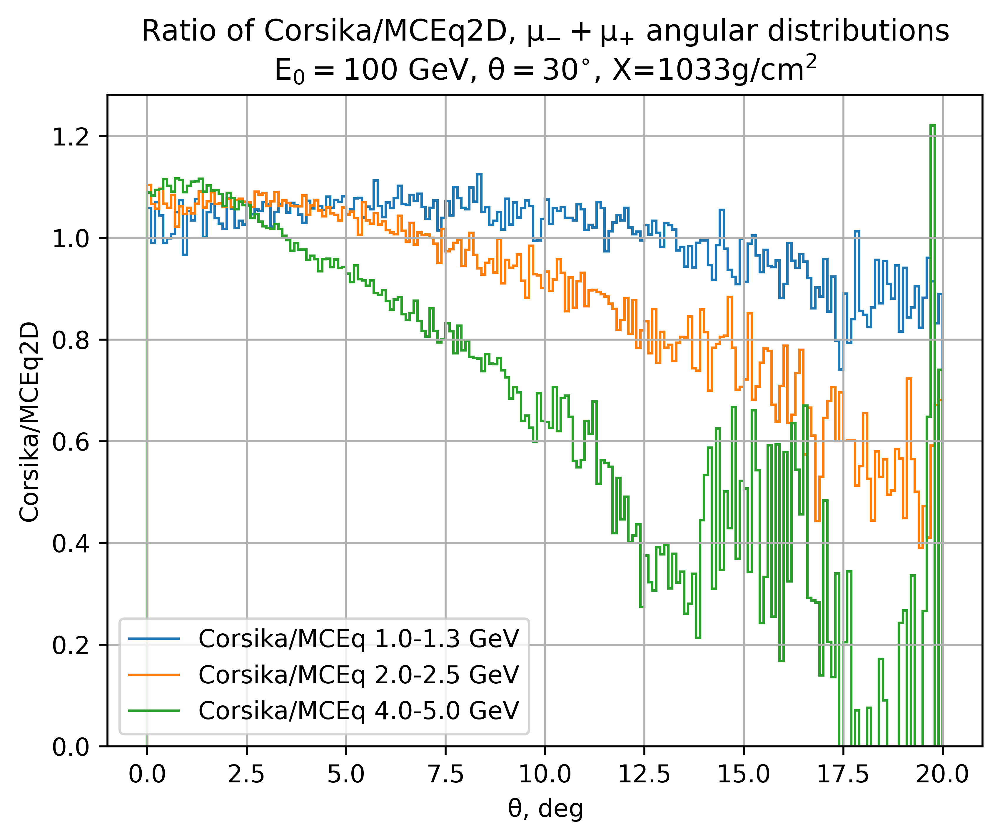

In [44]:
figure_name = "fig27.png"
xdepth = 1033
ixdepth = 2
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_en[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(corsika_comb_mu[ixdepth][ind_energy][0]/mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"Corsika/MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)
        
        
plt.title(r"Ratio of Corsika/MCEq2D, $\mu_{-} + \mu_{+}$ angular distributions" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"Corsika/MCEq2D")
# plt.yscale("log")
# plt.xlim(0.08, 0.1)
# plt.ylim(20, 25)
plt.grid()
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

# Corsika vs MCEq2D

In [45]:
# Get MCEq histogram
# angle_bins = fluka_ang_bins
angle_bins = np.deg2rad(np.linspace(0, 90, 91))
energy_bins = [1, 1.3, 2, 2.5, 4, 5]
mceq_hists_ang1 = mceq_dists.histograms(energy_bins, angle_bins)

  0%|          | 0/3 [00:00<?, ?it/s]

Particle 12, slant depth = 143
Particle 12, slant depth = 647
Particle 12, slant depth = 1033


 33%|███▎      | 1/3 [00:03<00:06,  3.14s/it]

Particle 13, slant depth = 143
Particle 13, slant depth = 647
Particle 13, slant depth = 1033


 67%|██████▋   | 2/3 [00:05<00:02,  2.63s/it]

Particle 14, slant depth = 143
Particle 14, slant depth = 647
Particle 14, slant depth = 1033


100%|██████████| 3/3 [00:08<00:00,  2.92s/it]


In [46]:
energy_bins = [1, 1.3, 2, 2.5, 4, 5]
angle_bins = np.deg2rad(np.linspace(0, 90, 91))
corsika_en_hist1 = corsika_en_theta_2dhist(energy_bins, 
                                          angle_bins,
                                          h5file=corsika_data_file)

corsika_comb_mu1 = combined_ang_data(corsika_en_hist1, (-13, 13))
corsika_comb_nue1 = combined_ang_data(corsika_en_hist1, (-12, 12))
corsika_comb_numu1 = combined_ang_data(corsika_en_hist1, (-14, 14))

pdg = -12
xdepth=143.0, number=2.4503e+06
xdepth=647.0, number=6.2800e+06
xdepth=1033.0, number=7.1195e+06
pdg = 12
xdepth=143.0, number=2.6638e+06
xdepth=647.0, number=6.7850e+06
xdepth=1033.0, number=7.7016e+06
pdg = -13
xdepth=143.0, number=6.3909e+06
xdepth=647.0, number=6.5302e+06
xdepth=1033.0, number=4.1115e+06
pdg = 13
xdepth=143.0, number=5.7256e+06
xdepth=647.0, number=5.8239e+06
xdepth=1033.0, number=3.5279e+06
pdg = -14
xdepth=143.0, number=8.7044e+06
xdepth=647.0, number=1.8000e+07
xdepth=1033.0, number=1.9141e+07
pdg = 14
xdepth=143.0, number=9.3611e+06
xdepth=647.0, number=1.8878e+07
xdepth=1033.0, number=1.9954e+07


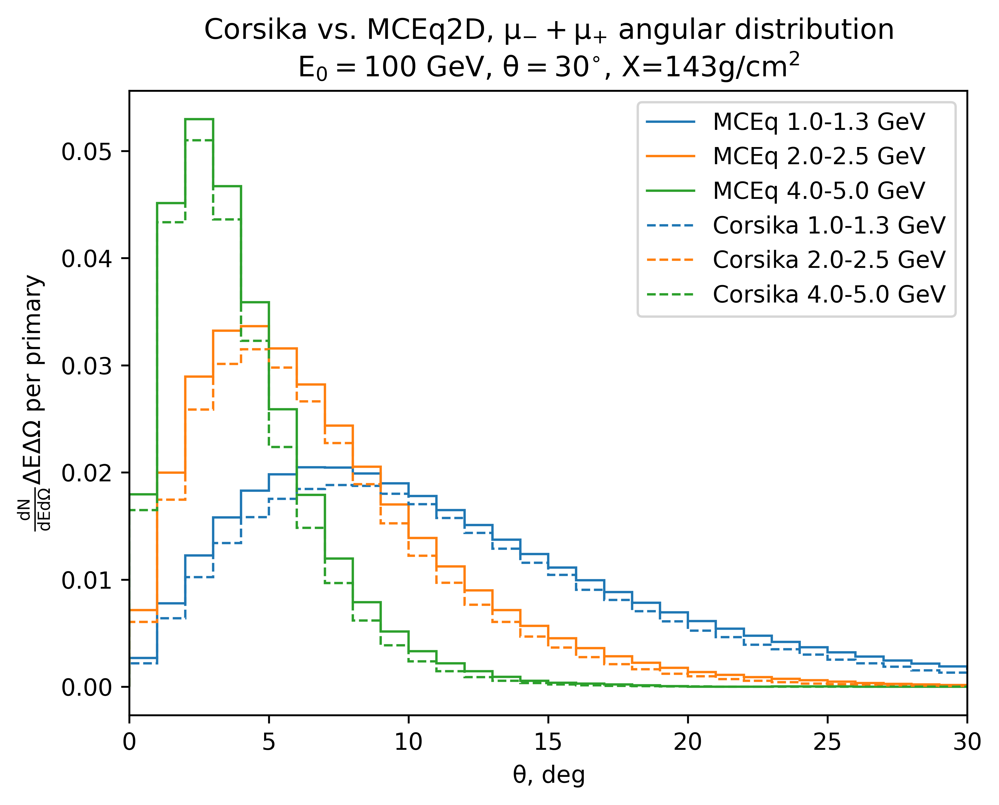

In [47]:
figure_name = "fig28.png"
xdepth = 143
ixdepth = 0
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_ang1[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang1[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)

icolor = 0
ienlabel = 0
for i, crs_comb_mu in enumerate(corsika_comb_mu1[ixdepth]):
    if i in [0, 2, 4]: # Choose energy ranges to plot
        line = plt.stairs(crs_comb_mu[0], np.rad2deg(crs_comb_mu[1]), 
                          label = f"Corsika {en_labels[ienlabel]} GeV",
                          color = line_colors[icolor],
                          linestyle = "--")
        icolor += 1
        ienlabel += 1  
          
        
        
plt.title(r"Corsika vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
# plt.yscale("log")
plt.xlim(0, 30)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

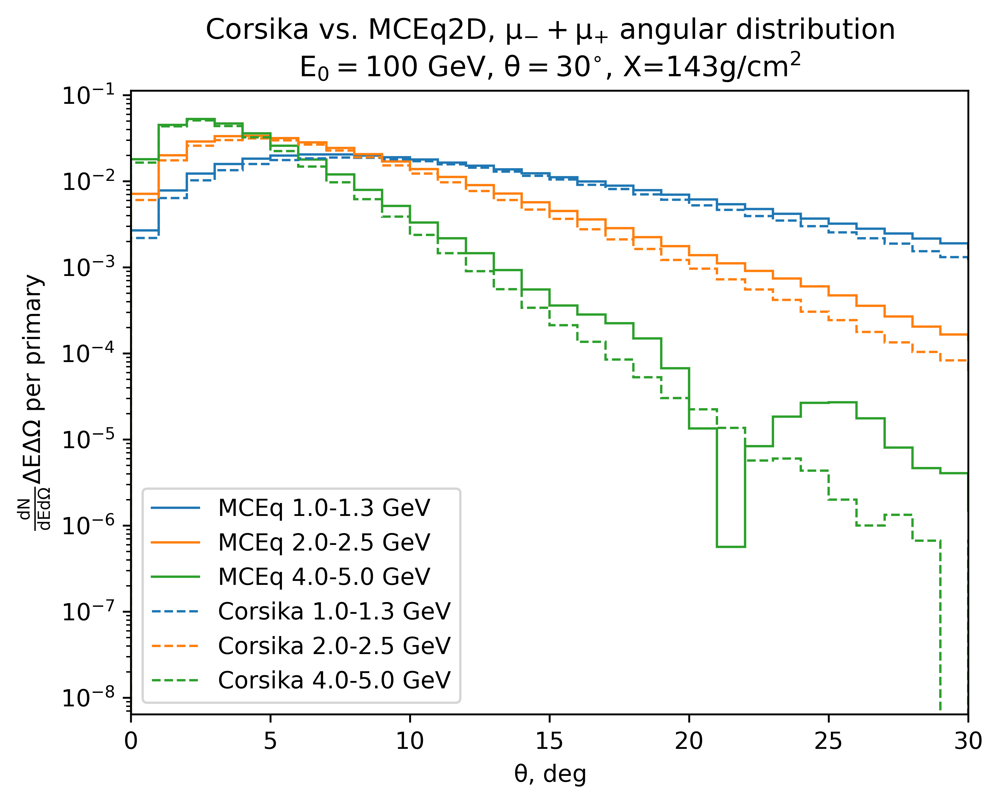

In [48]:
figure_name = "fig29.png"
xdepth = 143
ixdepth = 0
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_ang1[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang1[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)

icolor = 0
ienlabel = 0
for i, crs_comb_mu in enumerate(corsika_comb_mu1[ixdepth]):
    if i in [0, 2, 4]: # Choose energy ranges to plot
        line = plt.stairs(crs_comb_mu[0], np.rad2deg(crs_comb_mu[1]), 
                          label = f"Corsika {en_labels[ienlabel]} GeV",
                          color = line_colors[icolor],
                          linestyle = "--")
        icolor += 1
        ienlabel += 1  
          
        
        
plt.title(r"Corsika vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
plt.yscale("log")
plt.xlim(0, 30)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

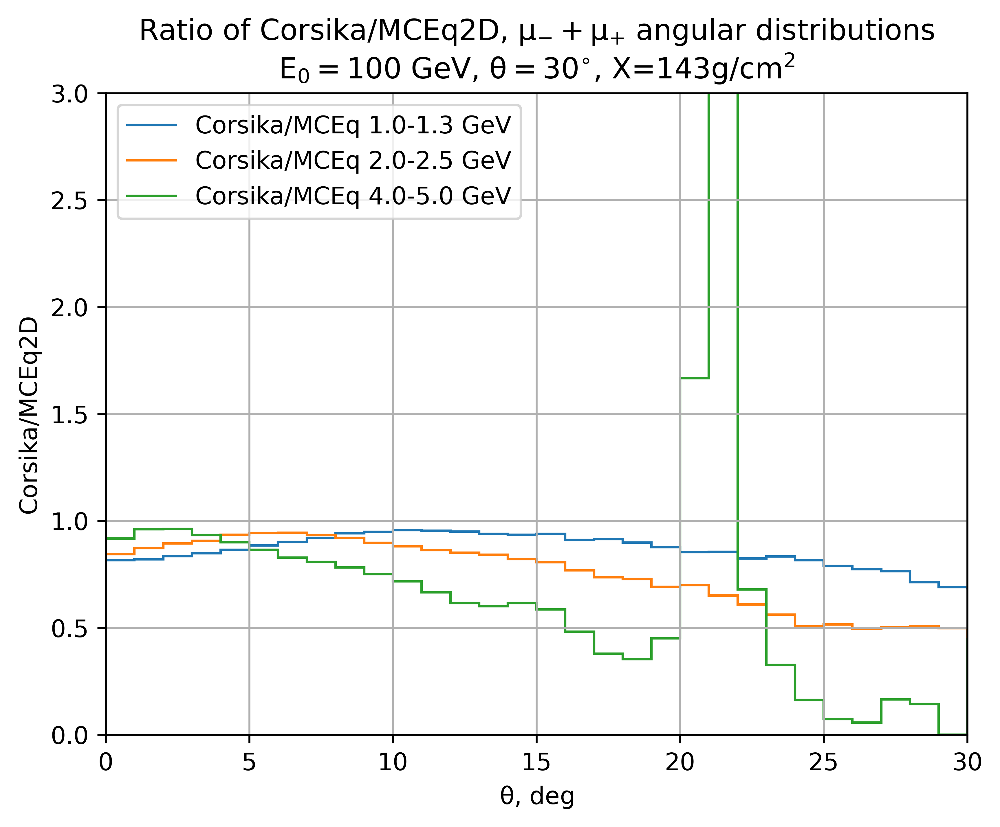

In [49]:
figure_name = "fig30.png"
xdepth = 143
ixdepth = 0
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_ang1[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang1[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(corsika_comb_mu1[ixdepth][ind_energy][0]/mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"Corsika/MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)
        
        
plt.title(r"Ratio of Corsika/MCEq2D, $\mu_{-} + \mu_{+}$ angular distributions" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"Corsika/MCEq2D")
# plt.yscale("log")
plt.xlim(0, 30)
plt.ylim(0, 3)
plt.grid()
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

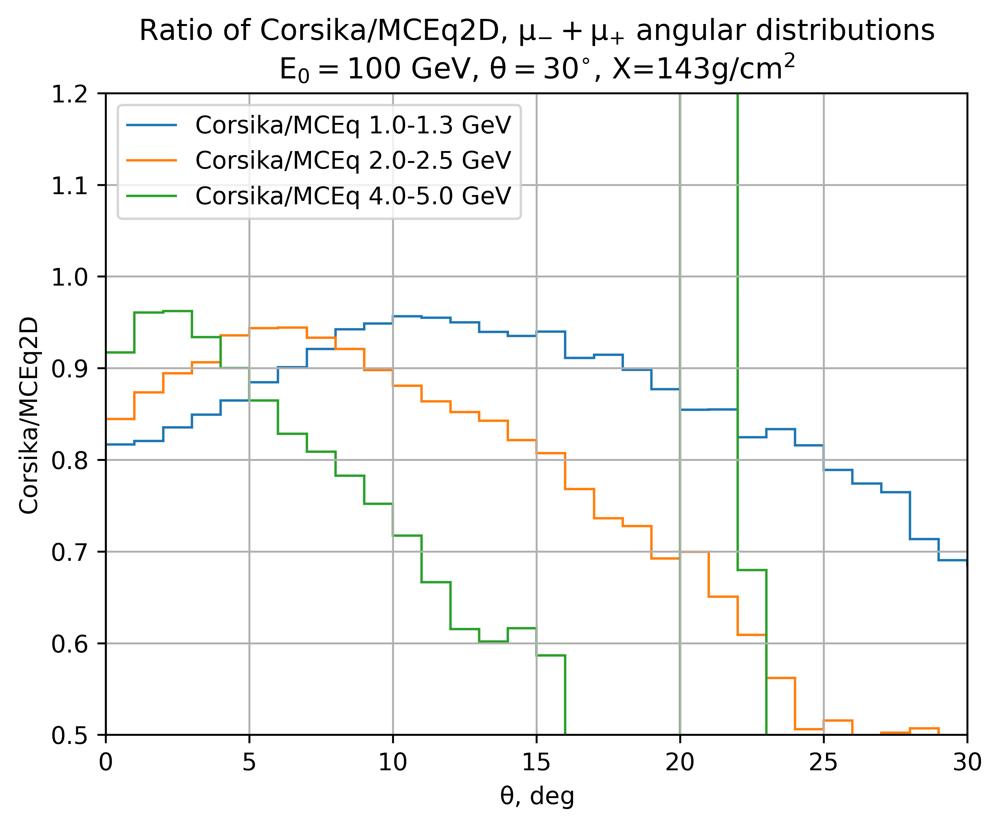

In [50]:
figure_name = "fig31.png"
xdepth = 143
ixdepth = 0
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_ang1[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang1[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(corsika_comb_mu1[ixdepth][ind_energy][0]/mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"Corsika/MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)
        
        
plt.title(r"Ratio of Corsika/MCEq2D, $\mu_{-} + \mu_{+}$ angular distributions" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"Corsika/MCEq2D")
# plt.yscale("log")
plt.xlim(0, 30)
plt.ylim(0.5, 1.2)
plt.grid()
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

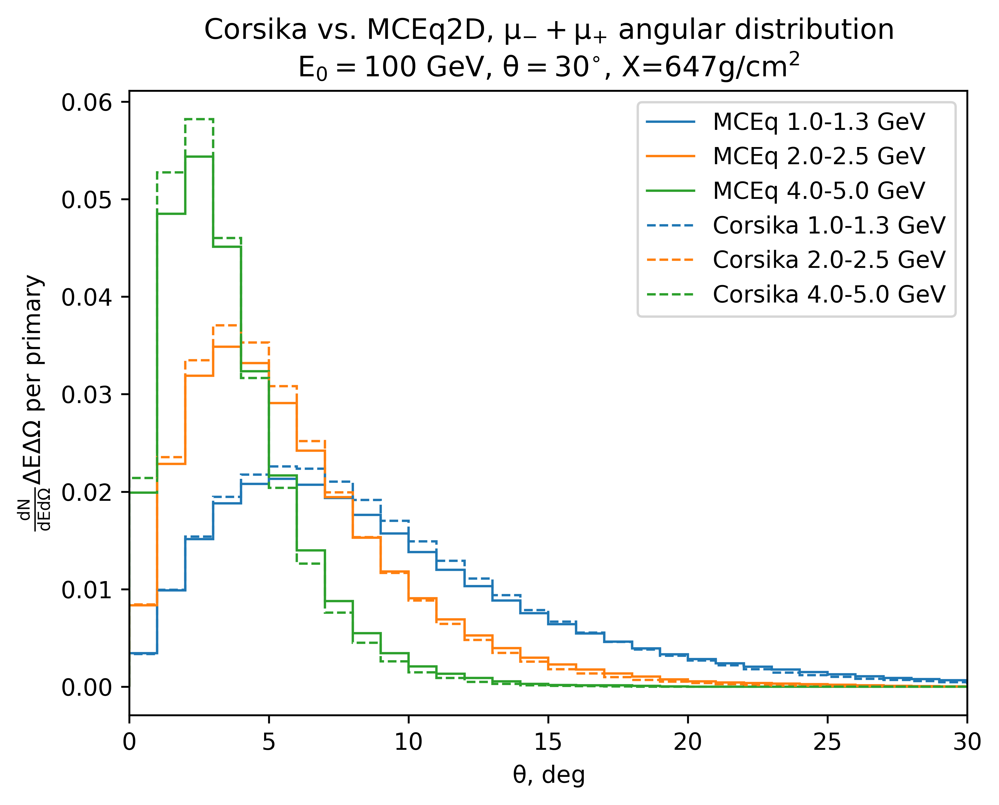

In [51]:
figure_name = "fig32.png"
xdepth = 647
ixdepth = 1
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_ang1[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang1[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)

icolor = 0
ienlabel = 0
for i, crs_comb_mu in enumerate(corsika_comb_mu1[ixdepth]):
    if i in [0, 2, 4]: # Choose energy ranges to plot
        line = plt.stairs(crs_comb_mu[0], np.rad2deg(crs_comb_mu[1]), 
                          label = f"Corsika {en_labels[ienlabel]} GeV",
                          color = line_colors[icolor],
                          linestyle = "--")
        icolor += 1
        ienlabel += 1  
          
        
        
plt.title(r"Corsika vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
# plt.yscale("log")
plt.xlim(0, 30)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

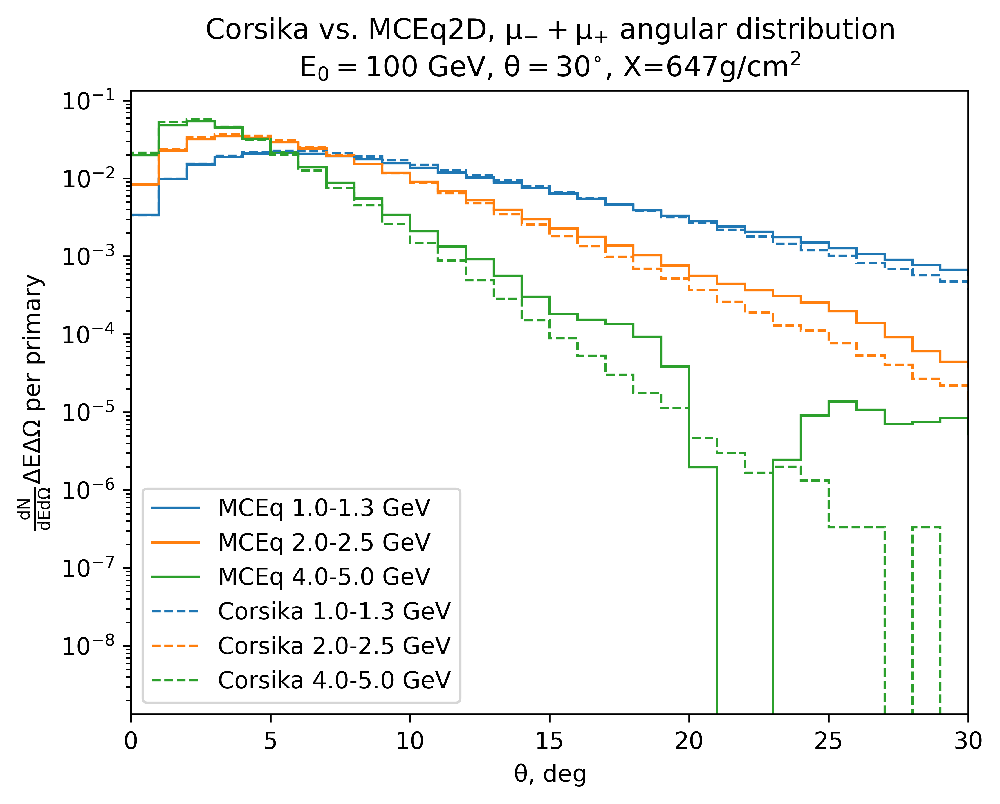

In [52]:
figure_name = "fig33.png"
xdepth = 647
ixdepth = 1
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_ang1[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang1[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)

icolor = 0
ienlabel = 0
for i, crs_comb_mu in enumerate(corsika_comb_mu1[ixdepth]):
    if i in [0, 2, 4]: # Choose energy ranges to plot
        line = plt.stairs(crs_comb_mu[0], np.rad2deg(crs_comb_mu[1]), 
                          label = f"Corsika {en_labels[ienlabel]} GeV",
                          color = line_colors[icolor],
                          linestyle = "--")
        icolor += 1
        ienlabel += 1  
          
        
        
plt.title(r"Corsika vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
plt.yscale("log")
plt.xlim(0, 30)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

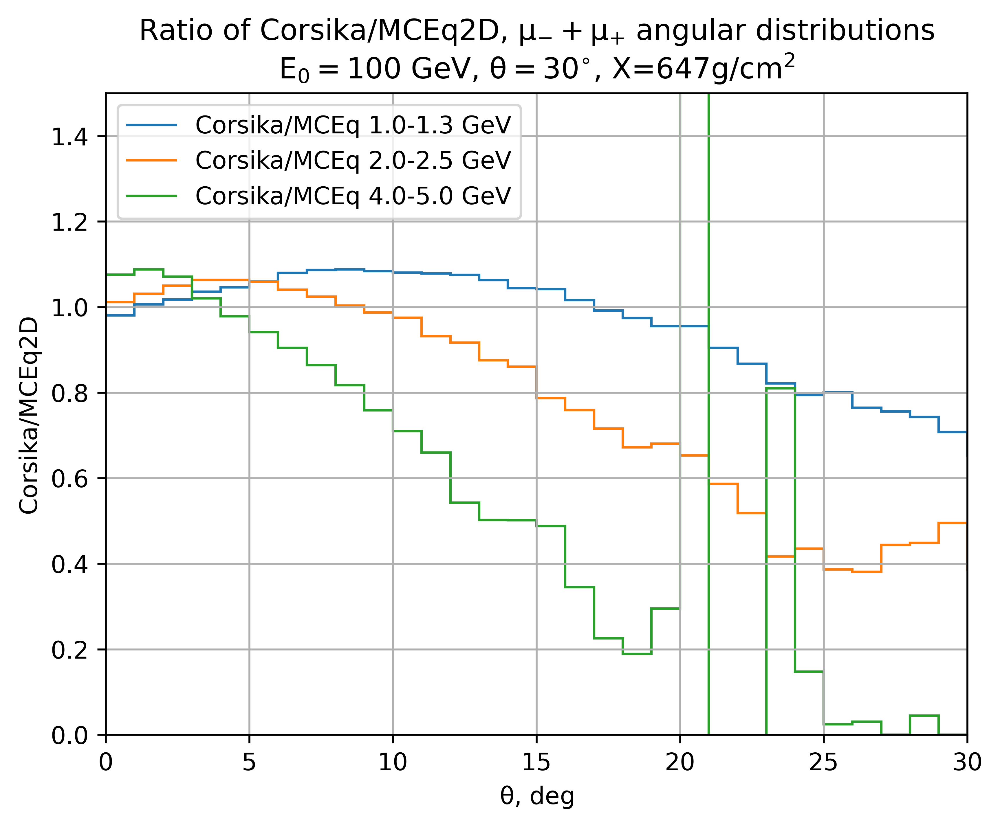

In [53]:
figure_name = "fig34.png"
xdepth = 647
ixdepth = 1
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_ang1[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang1[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(corsika_comb_mu1[ixdepth][ind_energy][0]/mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"Corsika/MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)
        
        
plt.title(r"Ratio of Corsika/MCEq2D, $\mu_{-} + \mu_{+}$ angular distributions" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"Corsika/MCEq2D")
# plt.yscale("log")
plt.xlim(0, 30)
plt.ylim(0, 1.5)
plt.grid()
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

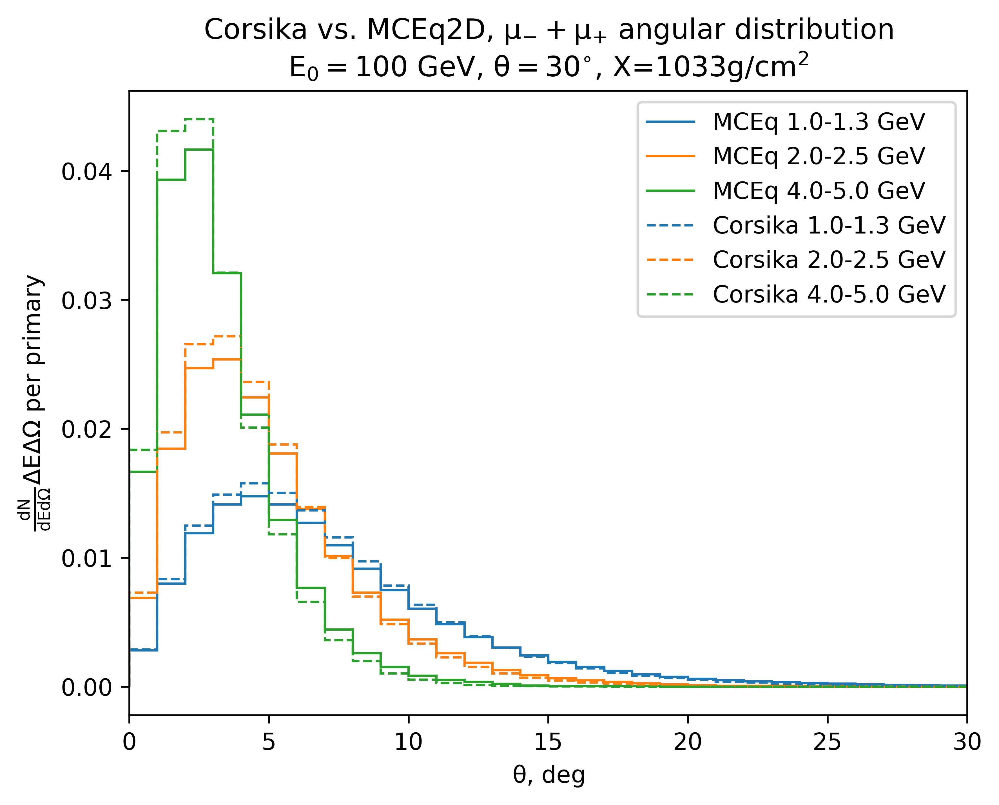

In [54]:
figure_name = "fig35.png"
xdepth = 1033
ixdepth = 2
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_ang1[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang1[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)

icolor = 0
ienlabel = 0
for i, crs_comb_mu in enumerate(corsika_comb_mu1[ixdepth]):
    if i in [0, 2, 4]: # Choose energy ranges to plot
        line = plt.stairs(crs_comb_mu[0], np.rad2deg(crs_comb_mu[1]), 
                          label = f"Corsika {en_labels[ienlabel]} GeV",
                          color = line_colors[icolor],
                          linestyle = "--")
        icolor += 1
        ienlabel += 1  
          
        
        
plt.title(r"Corsika vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
# plt.yscale("log")
plt.xlim(0, 30)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

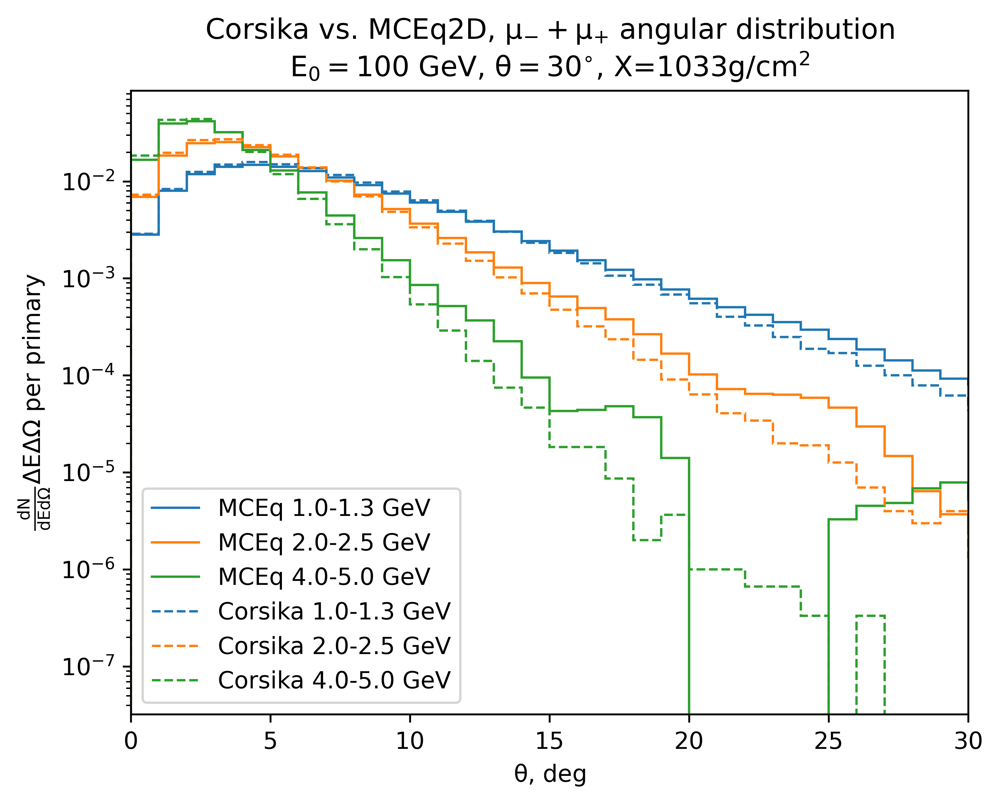

In [55]:
figure_name = "fig36.png"
xdepth = 1033
ixdepth = 2
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_ang1[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang1[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)

icolor = 0
ienlabel = 0
for i, crs_comb_mu in enumerate(corsika_comb_mu1[ixdepth]):
    if i in [0, 2, 4]: # Choose energy ranges to plot
        line = plt.stairs(crs_comb_mu[0], np.rad2deg(crs_comb_mu[1]), 
                          label = f"Corsika {en_labels[ienlabel]} GeV",
                          color = line_colors[icolor],
                          linestyle = "--")
        icolor += 1
        ienlabel += 1  
          
        
        
plt.title(r"Corsika vs. MCEq2D, $\mu_{-} + \mu_{+}$ angular distribution" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ per primary")
plt.yscale("log")
plt.xlim(0, 30)
# plt.ylim(20, 25)
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

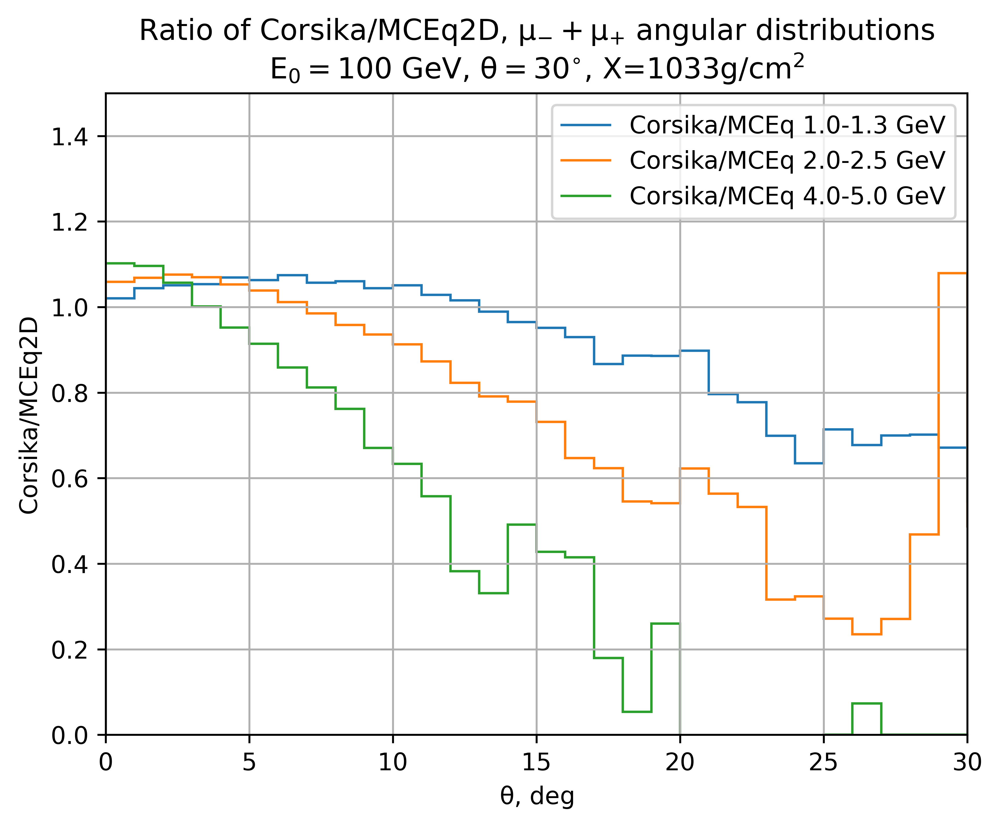

In [56]:
figure_name = "fig37.png"
xdepth = 1033
ixdepth = 2
line_colors = []
en_labels = []
for ind_energy, en1 in enumerate(mceq_hists_ang1[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_ang1[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.1f}-{en_range[1]:0.1f}"
        line = plt.stairs(corsika_comb_mu1[ixdepth][ind_energy][0]/mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"Corsika/MCEq {en_label} GeV")
        line_colors.append(line.get_edgecolor())
        en_labels.append(en_label)
        
        
plt.title(r"Ratio of Corsika/MCEq2D, $\mu_{-} + \mu_{+}$ angular distributions" + "\n" +
          r"$E_{0}=100$ GeV, $\theta=30^{\circ}$" + f", X={xdepth}" + r"$g/cm^2$")
plt.xlabel(r"$\theta$, deg")
plt.ylabel(r"Corsika/MCEq2D")
# plt.yscale("log")
plt.xlim(0, 30)
plt.ylim(0, 1.5)
plt.grid()
plt.legend(fontsize="8")  
plt.legend()
plt.savefig(dir_for_figures/figure_name)

In [57]:
fluka_hist = {}
for label in ("current", "develop"):
    fluka_hist[label] = fluka_histogram(label, 3)
    
fluka_ang_bins = fluka_hist["current"][0][0][0]   

In [58]:
print(mceq_dists.default_ebins[11:13])
print(mceq_dists.default_ebins[14:16])
print(mceq_dists.default_ebins[17:19])

[1.         1.25892541]
[1.99526231 2.51188643]
[3.98107171 5.01187234]


In [59]:
angle_bins = fluka_ang_bins
# energy_bins = [1, 1.25892541, 1.99526231,  2.51188643,  3.98107171, 5.01187234]
#energy_bins = mceq_dists.default_ebins # [1, 1.3, 2, 2.5, 4, 5]
energy_bins = [1, 1.3, 2, 2.5, 4, 5]
mceq_hists = mceq_dists.histograms(energy_bins, angle_bins)

  0%|          | 0/3 [00:00<?, ?it/s]

Particle 12, slant depth = 143
Particle 12, slant depth = 647
Particle 12, slant depth = 1033


 33%|███▎      | 1/3 [00:00<00:01,  1.21it/s]

Particle 13, slant depth = 143
Particle 13, slant depth = 647
Particle 13, slant depth = 1033


 67%|██████▋   | 2/3 [00:01<00:00,  1.44it/s]

Particle 14, slant depth = 143
Particle 14, slant depth = 647
Particle 14, slant depth = 1033


100%|██████████| 3/3 [00:02<00:00,  1.40it/s]


In [60]:
energy_bins = [1, 1.25892541, 1.99526231,  2.51188643,  3.98107171, 5.01187234]
mceq_hists_mb = mceq_dists.histograms(energy_bins, angle_bins)

  0%|          | 0/3 [00:00<?, ?it/s]

Particle 12, slant depth = 143
Particle 12, slant depth = 647
Particle 12, slant depth = 1033


 33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

Particle 13, slant depth = 143
Particle 13, slant depth = 647
Particle 13, slant depth = 1033


 67%|██████▋   | 2/3 [00:01<00:00,  1.50it/s]

Particle 14, slant depth = 143
Particle 14, slant depth = 647
Particle 14, slant depth = 1033


100%|██████████| 3/3 [00:02<00:00,  1.37it/s]


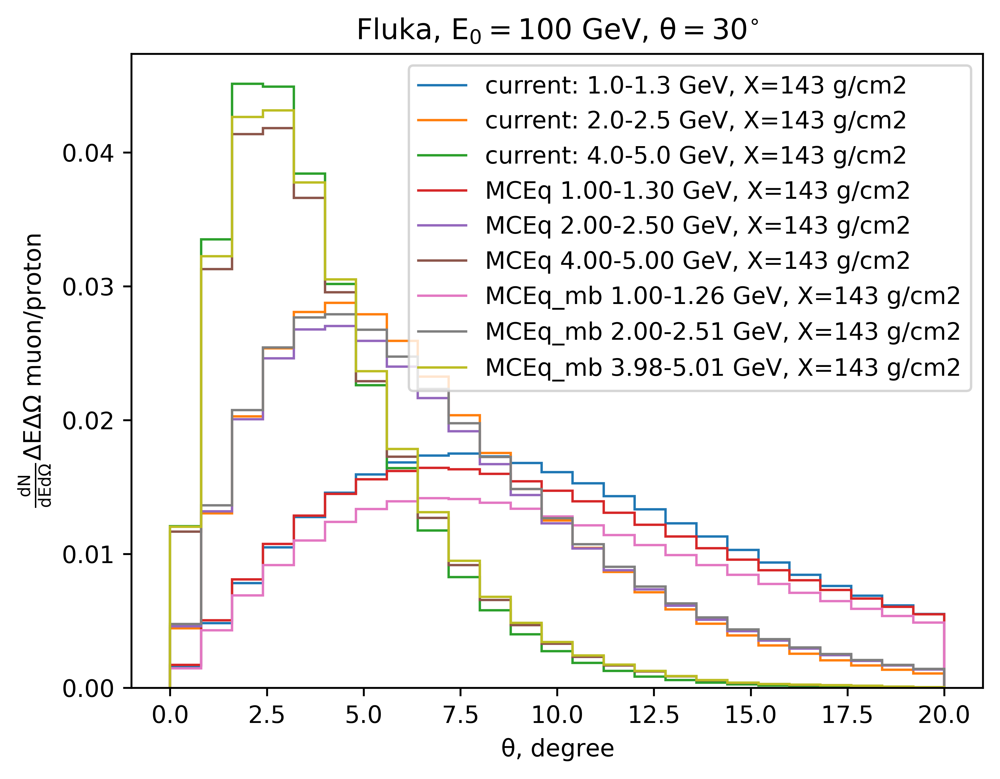

In [61]:

for ixdepth in range(3):
    for ienergy in range(3):
        if (ienergy in [0, 1, 2]) and (ixdepth in [0]):
            fl_dist = fluka_hist["current"][ixdepth][ienergy]
            line = plt.stairs(fl_dist[1], np.rad2deg(fl_dist[0]),
                    label = f"current: {fl_dist[4]} GeV, X={fl_dist[3]} g/cm2")

            # fl_dist = fluka_hist["develop"][ixdepth][ienergy]
            # plt.stairs(fl_dist[1], np.rad2deg(fl_dist[0]),
            #         label = f"develop: {fl_dist[4]} GeV, X={fl_dist[3]} g/cm2",
            #         color = line.get_edgecolor(),
            #         linestyle = "--")

# ixdepths = [2]
# for ixdepth in range(3):
#     if ixdepth in ixdepths: # Choose xdepths to plot
#         for i, ang_dist in enumerate(fluka_ang_dist[ixdepth]):
#             if i in [0]: # Choose energy ranges to plot
#                 plt.stairs(ang_dist[0], np.rad2deg(ang_dist[1]), label = f"{ang_dist[2]} GeV, X={ang_dist[3]} g/cm2")

xdepth = 143
for ind_energy, en1 in enumerate(mceq_hists[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.2f}-{en_range[1]:0.2f}"
        plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq {en_label} GeV, X={xdepth} g/cm2")
        
        
for ind_energy, en1 in enumerate(mceq_hists[13][xdepth]["en_bins"]):
    if ind_energy in [0, 2, 4]:
        mceq_plt = mceq_hists_mb[13][xdepth]
        en_range = mceq_plt["en_bins"][ind_energy:ind_energy +2]
        en_label = f"{en_range[0]:0.2f}-{en_range[1]:0.2f}"
        plt.stairs(mceq_plt["hist_en_ang"][ind_energy],
                    np.rad2deg(mceq_plt["ang_bins"]),
                    label = f"MCEq_mb {en_label} GeV, X={xdepth} g/cm2")        

plt.title(r"Fluka, $E_{0}=100$ GeV, $\theta=30^{\circ}$")
plt.xlabel(r"$\theta$, degree")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ muon/proton")
# plt.yscale("log")
# plt.xlim(0.08, 0.1)
# plt.ylim(20, 25)
plt.legend()

In [62]:
import sys
sys.path.append("/hetghome/antonpr/xmax_sigma/flincpy/scripts/corsika_flincpy")
from corsika_comparison import (corsika_hist_en, combined_data_en, 
                                 corsika_en_theta_2dhist,
                                 combined_ang_data)

In [63]:
# Corsika energy distributions
chist_en = corsika_hist_en(fluka_energy_bins_en, h5file=corsika_data_file)

corsika_07.h5: Number of primaries = 3.000000e+06


In [64]:
# Take a sum of particles
corsika_en_dist = {}
for i in range(3):
    corsika_en_dist[i]  = combined_data_en(chist_en, [-13, 13], i)


In [65]:
# Corsika angular distributions
# energy_bins = [1, 1.25892541, 1.99526231,  2.51188643,  3.98107171, 5.01187234]
energy_bins = [1, 1.35, 2, 2.58, 4, 5]
ang_bins = fluka_ang_bins
corsika_en_hist = corsika_en_theta_2dhist(energy_bins, 
                                          fluka_ang_bins,
                                          h5file=corsika_data_file)
corsika_comb_hist = combined_ang_data(corsika_en_hist, (-13, 13))

pdg = -12
xdepth=143.0, number=2.4503e+06
xdepth=647.0, number=6.2800e+06
xdepth=1033.0, number=7.1195e+06
pdg = 12
xdepth=143.0, number=2.6638e+06
xdepth=647.0, number=6.7850e+06
xdepth=1033.0, number=7.7016e+06
pdg = -13
xdepth=143.0, number=6.3909e+06
xdepth=647.0, number=6.5302e+06
xdepth=1033.0, number=4.1115e+06
pdg = 13
xdepth=143.0, number=5.7256e+06
xdepth=647.0, number=5.8239e+06
xdepth=1033.0, number=3.5279e+06
pdg = -14
xdepth=143.0, number=8.7044e+06
xdepth=647.0, number=1.8000e+07
xdepth=1033.0, number=1.9141e+07
pdg = 14
xdepth=143.0, number=9.3611e+06
xdepth=647.0, number=1.8878e+07
xdepth=1033.0, number=1.9954e+07


In [66]:
angle_bins = np.deg2rad(np.linspace(0, 90, 2))
energy_bins = fluka_energy_bins_en
mceq_hists = mceq_dists.histograms(energy_bins, angle_bins)

  0%|          | 0/3 [00:00<?, ?it/s]

Particle 12, slant depth = 143
Particle 12, slant depth = 647
Particle 12, slant depth = 1033


 33%|███▎      | 1/3 [00:10<00:20, 10.39s/it]

Particle 13, slant depth = 143
Particle 13, slant depth = 647
Particle 13, slant depth = 1033


 67%|██████▋   | 2/3 [00:22<00:11, 11.54s/it]

Particle 14, slant depth = 143
Particle 14, slant depth = 647
Particle 14, slant depth = 1033


100%|██████████| 3/3 [00:44<00:00, 14.77s/it]


In [67]:
angle_bins = np.deg2rad(np.linspace(0, 90, 2))
energy_bins = fluka_energy_bins_en
mceq_hists1 = mceq_dists1.histograms(energy_bins, angle_bins)

  0%|          | 0/3 [00:00<?, ?it/s]

Particle 12, slant depth = 143
Particle 12, slant depth = 638
Particle 12, slant depth = 1167


 33%|███▎      | 1/3 [00:10<00:21, 10.72s/it]

Particle 13, slant depth = 143
Particle 13, slant depth = 638
Particle 13, slant depth = 1167


 67%|██████▋   | 2/3 [00:23<00:12, 12.20s/it]

Particle 14, slant depth = 143
Particle 14, slant depth = 638
Particle 14, slant depth = 1167


100%|██████████| 3/3 [00:43<00:00, 14.57s/it]


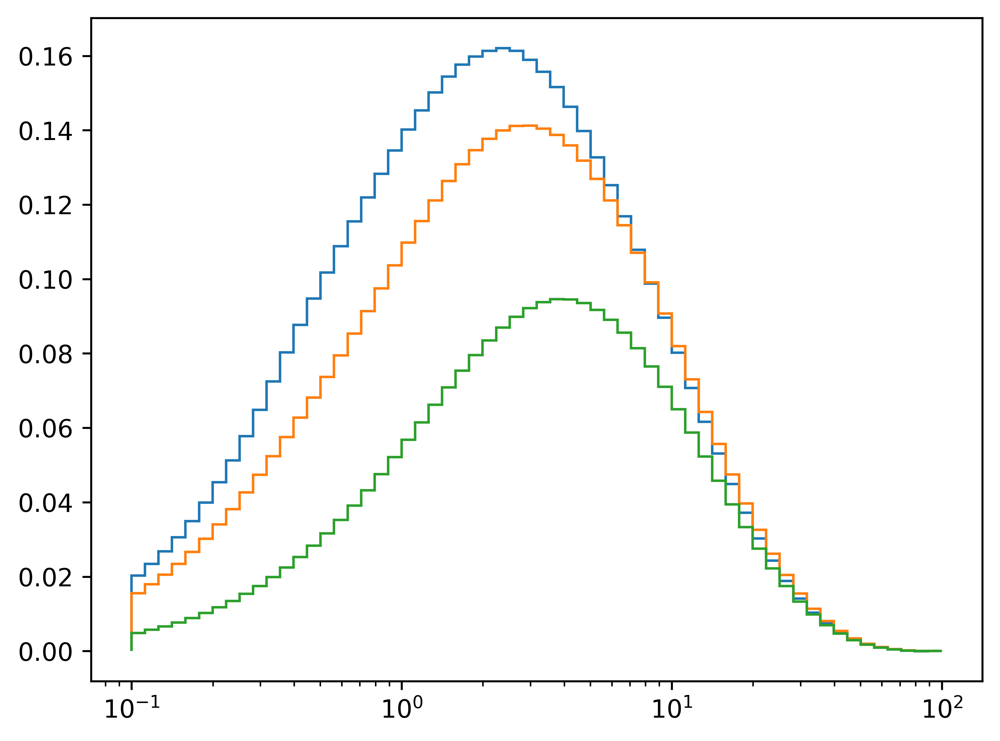

In [68]:

for xdepth in [143, 647, 1033]:
    plt.stairs(mceq_hists[13][xdepth]["hist_en_ang"].T[0],
                mceq_hists[13][xdepth]["en_bins"])
        
plt.xscale("log")        

In [69]:
# for xdepth in [143, 647, 1033]:
#     plt.stairs(mceq_hists[13][xdepth]["hist_en_ang"].T[0],
#                 mceq_hists[13][xdepth]["en_bins"], label = f"MCEq, X={xdepth}")
plt.rcParams['text.usetex'] = True
xdepth_list = [143, 647, 1033]
for ixdepth in range(3):
    fl_hist_en = fluka_hist_en["current"][ixdepth]
    line = plt.stairs(fl_hist_en[1], fl_hist_en[0], 
                      label = f"Fluka X={fl_hist_en[3]} g/cm2",
                      linestyle = "--")

    line = plt.stairs(mceq_hists[13][xdepth_list[ixdepth]]["hist_en_ang"].T[0],
                mceq_hists[13][xdepth_list[ixdepth]]["en_bins"], 
                label = f"MCEq2D, X={xdepth_list[ixdepth]} g/cm2",
                color = line.get_edgecolor(),
                    #   linestyle = "--"
                      )
    
    # fl_hist_en = corsika_en_dist[ixdepth]
    # plt.stairs(fl_hist_en[0], fl_hist_en[1], 
    #                   label = f"corsika {fl_hist_en[3]} g/cm2",
    #                   color = line.get_edgecolor(),
    #                   linestyle = "--"
    #                   )

plt.xscale("log")
plt.xlim(1e-1, 1e2)
# plt.yscale("log")
plt.xlabel("E, GeV")
plt.ylabel(r"$\frac{dN}{dE}\Delta E$ per primary")
plt.legend(fontsize="8")   
# plt.title(r"Fluka, $E_{0}=100$ GeV, $\theta=30^{\circ}$")

Error in callback <function _draw_all_if_interactive at 0x7ff9888b8ee0> (for post_execute):


RuntimeError: latex was not able to process the following string:
b'$\\\\mathdefault{0.000}$'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmp29hiu_s1 194bd70d18589cd90a44442a41d9cc58.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.25 (TeX Live 2023) (preloaded format=latex)
entering extended mode
(./194bd70d18589cd90a44442a41d9cc58.tex
LaTeX2e <2022-11-01> patch level 1
L3 programming layer <2023-04-19>
(/hetghome/antonpr/latex/texlive/2023/texmf-dist/tex/latex/base/article.cls
Document Class: article 2022/07/02 v1.4n Standard LaTeX document class
(/hetghome/antonpr/latex/texlive/2023/texmf-dist/tex/latex/base/size10.clo))

! LaTeX Error: File `type1cm.sty' not found.

Type X to quit or <RETURN> to proceed,
or enter new name. (Default extension: sty)

Enter file name: 
! Emergency stop.
<read *> 
         
l.7 \usepackage
               {type1ec}^^M
No pages of output.
Transcript written on tmp29hiu_s1/194bd70d18589cd90a44442a41d9cc58.log.




RuntimeError: latex was not able to process the following string:
b'$\\\\mathdefault{0.000}$'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmpy0z03lv3 194bd70d18589cd90a44442a41d9cc58.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.25 (TeX Live 2023) (preloaded format=latex)
entering extended mode
(./194bd70d18589cd90a44442a41d9cc58.tex
LaTeX2e <2022-11-01> patch level 1
L3 programming layer <2023-04-19>
(/hetghome/antonpr/latex/texlive/2023/texmf-dist/tex/latex/base/article.cls
Document Class: article 2022/07/02 v1.4n Standard LaTeX document class
(/hetghome/antonpr/latex/texlive/2023/texmf-dist/tex/latex/base/size10.clo))

! LaTeX Error: File `type1cm.sty' not found.

Type X to quit or <RETURN> to proceed,
or enter new name. (Default extension: sty)

Enter file name: 
! Emergency stop.
<read *> 
         
l.7 \usepackage
               {type1ec}^^M
No pages of output.
Transcript written on tmpy0z03lv3/194bd70d18589cd90a44442a41d9cc58.log.




<Figure size 3840x2880 with 1 Axes>

In [ ]:
# energy_bins = [1, 1.25892541, 1.99526231,  2.51188643,  3.98107171, 5.01187234]
energy_bins = [1, 1.35, 2, 2.58, 4, 5]
ang_bins = fluka_ang_bins
corsika_en_hist = corsika_en_theta_2dhist(energy_bins, 
                                          fluka_ang_bins,
                                          h5file=corsika_data_file)
corsika_comb_hist = combined_ang_data(corsika_en_hist, (-13, 13))

Tot sum = 0.314803, corsika:[2.0, 2.58] GeV, X=143.0 g/cm2


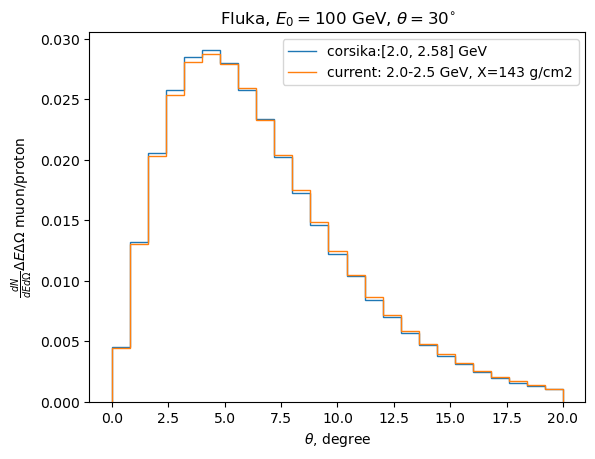

In [ ]:
ixlist = [2]

ixdepth = 0
linecolor = []
# for ixdepth in range(3):
    # if ixdepth in ixlist: # Choose xdepths to plot
for i, ang_dist in enumerate(corsika_comb_hist[ixdepth]):
    if i in [2]: # Choose energy ranges to plot
        line = plt.stairs(ang_dist[0], np.rad2deg(ang_dist[1]), label = f"corsika:{ang_dist[2]} GeV")
        linecolor.append(line.get_edgecolor())
        print(f"Tot sum = {np.sum(ang_dist[0])}, corsika:{ang_dist[2]} GeV, X={ang_dist[3]} g/cm2")


for ixdepth in range(3):
    for ienergy in range(3):
        if (ienergy in [1]) and (ixdepth in [0]):
            fl_dist = fluka_hist["current"][ixdepth][ienergy]
            line = plt.stairs(fl_dist[1], np.rad2deg(fl_dist[0]),
                    label = f"current: {fl_dist[4]} GeV, X={fl_dist[3]} g/cm2")

# icolor = 0                
# # for ixdepth in range(3):
# #     if ixdepth in ixlist: # Choose xdepths to plot
# for i, ang_dist in enumerate(fluka_ang_dist[ixdepth]):
#     if i in [0, 1, 2]: # Choose energy ranges to plot
#         plt.stairs(ang_dist[0], np.rad2deg(ang_dist[1]),
#                     color=linecolor[icolor],
#                     linestyle = "--", 
#                     label = f"fluka:{ang_dist[2]} GeV, X={ang_dist[3]} g/cm2")
#         icolor += 1
#         print(f"Tot sum = {np.sum(ang_dist[0])}, fluka:{ang_dist[2]} GeV, X={ang_dist[3]} g/cm2")



plt.title(r"Fluka, $E_{0}=100$ GeV, $\theta=30^{\circ}$")
plt.xlabel(r"$\theta$, degree")
# plt.yscale("log")
plt.ylabel(r"$\frac{dN}{dEd\Omega}\Delta E\Delta \Omega$ muon/proton")
plt.legend()

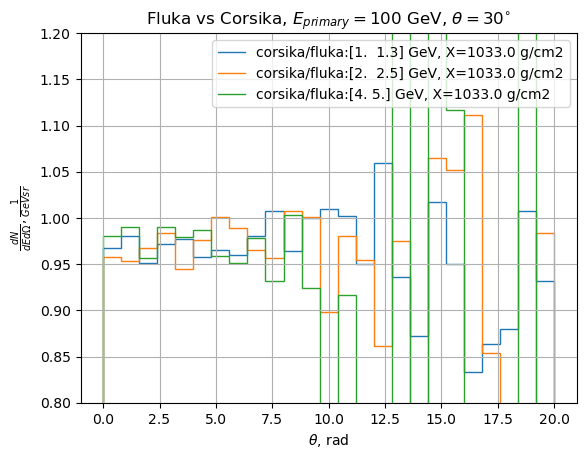

In [ ]:
ixdepth = 2
# for ixdepth in range(3):
#     if ixdepth in ixlist: # Choose xdepths to plot        
en_list = [0, 2, 4]    
for i in range(3):
    ang_dist = corsika_comb_hist[ixdepth + 1][en_list[i]]
    plot_dist_cors = ang_dist[0]
    
    ang_dist = fluka_ang_dist[ixdepth][i]
    plot_dist_fluk = ang_dist[0]

    # plt.stairs(plot_dist_fluk, ang_dist[1], label = f"fluka:{ang_dist[2]} GeV, X={ang_dist[3]} g/cm2")
    # plt.stairs(plot_dist_cors, ang_dist[1], label = f"corsika:{ang_dist[2]} GeV, X={ang_dist[3]} g/cm2")
    plt.stairs(plot_dist_cors/plot_dist_fluk, np.rad2deg(ang_dist[1]), label = f"corsika/fluka:{ang_dist[2]} GeV, X={ang_dist[3]} g/cm2") 
    # plt.stairs((np.cos((ang_dist[1][:-1] + ang_dist[1][1:])/2)**2), ang_dist[1], label = f"fluka:{ang_dist[2]} GeV, X={ang_dist[3]} g/cm2") 
    # print(plot_dist_fluk/plot_dist_cors, f"fluka/corsika:{ang_dist[2]} GeV, X={ang_dist[3]} g/cm2")


plt.title(r"Fluka vs Corsika, $E_{primary}=100$ GeV, $\theta=30^{\circ}$")
plt.xlabel(r"$\theta$, rad")
# plt.ylabel(r"fluka/corsika of $\frac{dN}{dEd\Omega}, \frac{1}{GeV sr}$")
plt.ylabel(r"$\frac{dN}{dEd\Omega}, \frac{1}{GeV sr}$")
plt.ylim(0.8,1.2)
plt.legend()
plt.grid()

In [ ]:
fluka_en_spec_dev = fluka_en_data("develop_version")
fluka_en_spec_cur = fluka_en_data("current_version")

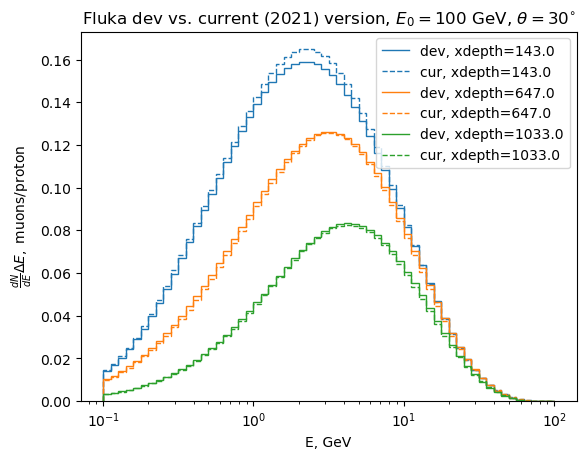

In [ ]:
for i, spec_data in enumerate(fluka_en_spec_dev):
    spec_data = fluka_en_spec_dev[i]
    line = plt.stairs(spec_data[1], spec_data[0], label = f"dev, xdepth={spec_data[3]}")
    spec_data = fluka_en_spec_cur[i]
    plt.stairs(spec_data[1], spec_data[0],
               color = line.get_edgecolor(),
               linestyle = "--", 
               label = f"cur, xdepth={spec_data[3]}")  

plt.title(r"Fluka dev vs. current (2021) version, $E_{0}=100$ GeV, $\theta=30^{\circ}$")   
plt.xscale("log")
plt.xlabel("E, GeV")
plt.ylabel(r"$\frac{dN}{dE}\Delta E,$ muons/proton")
# plt.yscale("log")
plt.legend() 

In [ ]:
import sys
sys.path.append("/hetghome/antonpr/xmax_sigma/flincpy/scripts/corsika_flincpy")
print(sys.path)

['/hetghome/antonpr/xmax_sigma/flincpy/scripts/fluka_comparison', '/hetghome/antonpr/xmax_sigma/flincpy/scripts/fluka_comparison', '/hetghome/antonpr/xmax_sigma/flincpy/scripts/fluka_comparison', '/hetghome/antonpr/xmax_sigma/flincpy', '/hetghome/antonpr/miniconda3/envs/env_impy/lib/python39.zip', '/hetghome/antonpr/miniconda3/envs/env_impy/lib/python3.9', '/hetghome/antonpr/miniconda3/envs/env_impy/lib/python3.9/lib-dynload', '', '/hetghome/antonpr/miniconda3/envs/env_impy/lib/python3.9/site-packages', '/hetghome/antonpr/chromo/src', '/hetghome/antonpr/MCEq', '/hetghome/antonpr/xmax_sigma/flincpy/scripts/corsika_flincpy', '/hetghome/antonpr/xmax_sigma/flincpy/scripts/corsika_flincpy', '/hetghome/antonpr/xmax_sigma/flincpy/scripts/corsika_flincpy', '/hetghome/antonpr/xmax_sigma/flincpy/scripts/corsika_flincpy', '/hetghome/antonpr/xmax_sigma/flincpy/scripts/corsika_flincpy', '/hetghome/antonpr/xmax_sigma/flincpy/scripts/corsika_flincpy']


In [ ]:

from corsika_comparison import (corsika_hist, combined_data, 
                                corsika_en_theta_2dhist)

In [ ]:

energy_bins = mceq_dist.e_bins

en_hist = corsika_hist(en_bins = energy_bins)
en_hist_tanya = corsika_hist(en_bins = energy_bins, 
                            h5file=corsika_data_file)

en_hist3 = corsika_hist(en_bins = energy_bins,
                        h5file=corsika_data_file)

en_hist4 = corsika_hist(en_bins = energy_bins,
                        h5file=corsika_data_file)

NameError: name 'mceq_dist' is not defined

/tmp/ipykernel_1267941/1594495603.py:8: RuntimeWarning: invalid value encountered in divide
  plt.stairs(cdata[0]/cdata1[0], cdata[1], label = f"Corsika_yesterday {cdata[2]}")


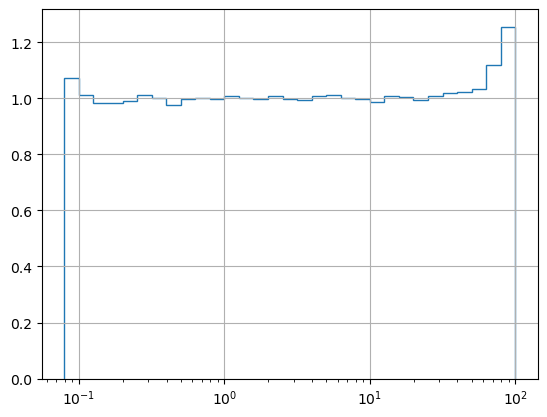

In [ ]:

pdg = 13
xdepth = 3
cdata = combined_data(en_hist3, (-pdg, pdg), xdepth)
cdata1 = combined_data(en_hist3, (-pdg, pdg), xdepth)
# plt.stairs(*cdata[0:2], label = f"Corsika_new {cdata[2]}")

cdata = combined_data(en_hist4, (-pdg, pdg), xdepth)
plt.stairs(cdata[0]/cdata1[0], cdata[1], label = f"Corsika_yesterday {cdata[2]}")

plt.xscale("log")
plt.grid()

In [ ]:
fluka_red_bins = merge_bins(fluka_en_spec_dev[2][1], fluka_en_spec_dev[2][0])

In [ ]:
fluka_red_bins[1]

array([  0.1      ,   0.1258925,   0.1584893,   0.1995262,   0.2511887,
         0.3162278,   0.3981072,   0.5011873,   0.6309574,   0.7943283,
         1.       ,   1.258925 ,   1.584893 ,   1.995263 ,   2.511887 ,
         3.162278 ,   3.981072 ,   5.011873 ,   6.309574 ,   7.943283 ,
        10.       ,  12.58926  ,  15.84893  ,  19.95263  ,  25.11887  ,
        31.62278  ,  39.81072  ,  50.11873  ,  63.09574  ,  79.43283  ,
       100.       ])

In [ ]:
# mceq_dist.flux["mu"]
mceq_dist.e_bins[1:32]

array([  0.1       ,   0.12589254,   0.15848932,   0.19952623,
         0.25118864,   0.31622777,   0.39810717,   0.50118723,
         0.63095734,   0.79432823,   1.        ,   1.25892541,
         1.58489319,   1.99526231,   2.51188643,   3.16227766,
         3.98107171,   5.01187234,   6.30957344,   7.94328235,
        10.        ,  12.58925412,  15.84893192,  19.95262315,
        25.11886432,  31.6227766 ,  39.81071706,  50.11872336,
        63.09573445,  79.43282347, 100.        ])

In [ ]:
# fluka_en_spec_dev[0][1]*(fluka_en_spec_dev[0][0][1:] - fluka_en_spec_dev[0][0][0:-1])

In [ ]:
fluka_red_bins[0]/mceq_dist.flux["mu"][1:31]

array([1.07567631, 1.09223836, 1.10431679, 1.10901674, 1.10218757,
       1.0914634 , 1.07731593, 1.06261502, 1.04799399, 1.03479909,
       1.026952  , 1.02250259, 1.02288478, 1.02448593, 1.02797035,
       1.03038166, 1.03381072, 1.04014286, 1.04391708, 1.05004418,
       1.05893343, 1.06642839, 1.06846183, 1.06235005, 1.04350519,
       0.9984376 , 0.90986021, 0.74146427, 0.49393863, 1.15498847])

In [ ]:
first_negative = np.where(mceq_dist.flux["mu"] < 0)[0][0]
mceq_dist.flux["mu"][:first_negative]
mceq_dist.flux["mu"]
# len(mceq_dist.flux["mu"][:first_negative])

array([ 4.92583851e-03,  6.75013460e-03,  9.18207895e-03,  1.24211974e-02,
        1.66815643e-02,  2.22501836e-02,  2.94076103e-02,  3.84015415e-02,
        4.94570923e-02,  6.26153934e-02,  7.76515718e-02,  9.40093621e-02,
        1.10850959e-01,  1.26959995e-01,  1.41237483e-01,  1.52440477e-01,
        1.59418596e-01,  1.60930585e-01,  1.56207117e-01,  1.45444685e-01,
        1.29497084e-01,  1.09425522e-01,  8.72828900e-02,  6.51366716e-02,
        4.48520736e-02,  2.80217606e-02,  1.54919704e-02,  7.22242403e-03,
        2.54721208e-03,  5.35741278e-04,  7.27782574e-06, -1.67354641e-05,
        1.37262903e-06, -1.81002950e-07,  7.93172022e-09, -5.25264000e-10,
        1.52859617e-11, -6.50889431e-13,  1.36131914e-14, -4.17108174e-16,
        6.62691636e-18, -1.57080305e-19,  1.98619943e-21, -3.85250941e-23,
        4.03949314e-25, -6.71631395e-27,  6.05701992e-29, -8.92810158e-31,
        5.88164071e-31, -1.30479612e-32,  2.40495437e-33])

In [ ]:
mceq_dist.e_bins[0:first_negative+1]

array([7.94328235e-02, 1.00000000e-01, 1.25892541e-01, 1.58489319e-01,
       1.99526231e-01, 2.51188643e-01, 3.16227766e-01, 3.98107171e-01,
       5.01187234e-01, 6.30957344e-01, 7.94328235e-01, 1.00000000e+00,
       1.25892541e+00, 1.58489319e+00, 1.99526231e+00, 2.51188643e+00,
       3.16227766e+00, 3.98107171e+00, 5.01187234e+00, 6.30957344e+00,
       7.94328235e+00, 1.00000000e+01, 1.25892541e+01, 1.58489319e+01,
       1.99526231e+01, 2.51188643e+01, 3.16227766e+01, 3.98107171e+01,
       5.01187234e+01, 6.30957344e+01, 7.94328235e+01, 1.00000000e+02])

In [ ]:
mceq_dist.flux["mu"][1:31]

array([6.75013460e-03, 9.18207895e-03, 1.24211974e-02, 1.66815643e-02,
       2.22501836e-02, 2.94076103e-02, 3.84015415e-02, 4.94570923e-02,
       6.26153934e-02, 7.76515718e-02, 9.40093621e-02, 1.10850959e-01,
       1.26959995e-01, 1.41237483e-01, 1.52440477e-01, 1.59418596e-01,
       1.60930585e-01, 1.56207117e-01, 1.45444685e-01, 1.29497084e-01,
       1.09425522e-01, 8.72828900e-02, 6.51366716e-02, 4.48520736e-02,
       2.80217606e-02, 1.54919704e-02, 7.22242403e-03, 2.54721208e-03,
       5.35741278e-04, 7.27782574e-06])

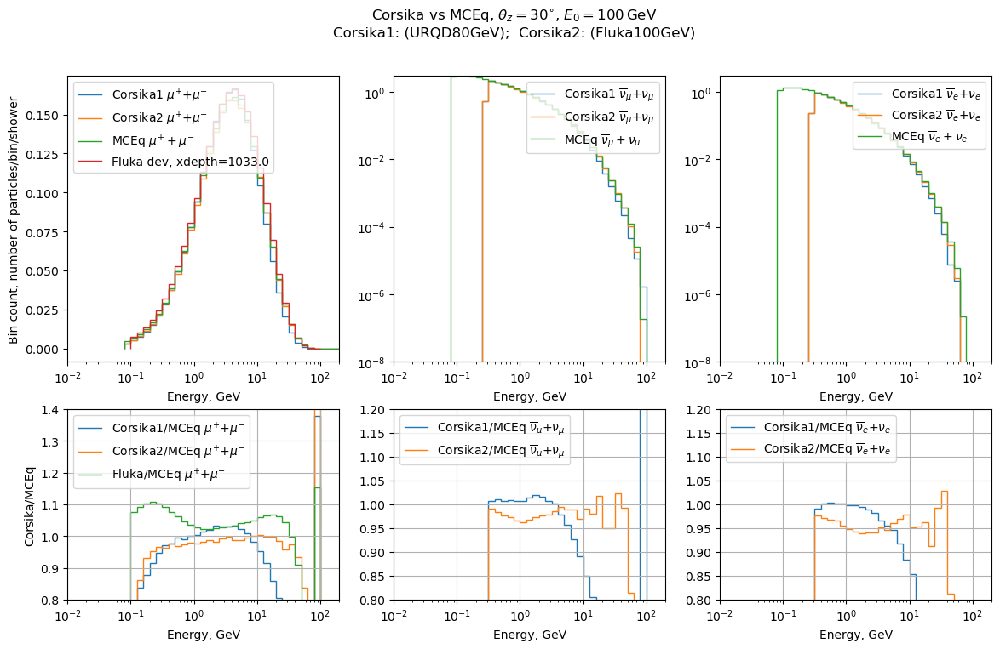

In [ ]:

figure = plt.figure(figsize=(14, 8))
grid_spec = figure.add_gridspec(nrows=2, ncols=3, width_ratios=[1, 1, 1], height_ratios=[3, 2])


# plt.figure(figsize=(6, 8))
# fig, (ax1, ax2) = plt.subplots(1, 2, width_ratios =[1, 1])
# fig.set_figure(figsize=(6, 8))
# ax1 = gs[0, 0]
# ax2 = gs[0, 1]
# fig.suptitle('Horizontally stacked subplots')

axis = []

for i in range(2):
    axis_row = []
    for j in range(3):
        axis_row.append(figure.add_subplot(grid_spec[i, j]))
    axis.append(axis_row)

# plt.title(r"Muons: Corsika vs MCEq, $\theta_{z} = 30^{\circ}$, $E_{0} = 100\,$GeV ")
figure.suptitle(r"Corsika vs MCEq, $\theta_{z} = 30^{\circ}$, $E_{0} = 100\,$GeV" + "\n" + 
                "Corsika1: (URQD80GeV);  Corsika2: (Fluka100GeV)")
ax = axis[0][0]
cdata = combined_data(en_hist_tanya, (-13, 13), 3)
ax.stairs(*cdata[0:2], label = f"Corsika1 {cdata[2]}")

# cdata = combined_data(en_hist, (-13, 13), 3)
# plt.stairs(*cdata[0:2], label = f"corsika {cdata[2]}")

cdata = combined_data(en_hist3, (-13, 13), 3)
ax.stairs(*cdata[0:2], label = f"Corsika2 {cdata[2]}")

# plt.stairs(mceq_loss.flux["mu"], mceq_loss.e_bins, 
#            label = r"${\mu}^{+} + {\mu}^{-}$ mceq", linestyle='--')


mceq_dist.flux["mu"]
ax.stairs(mceq_dist.flux["mu"], mceq_dist.e_bins, 
           label = r"MCEq ${\mu}^{+} + {\mu}^{-}$", linestyle='-')

spec_data = fluka_en_spec_dev[2]
ax.stairs(*fluka_red_bins, label = f"Fluka dev, xdepth={spec_data[3]}")

ax.set_xlabel("Energy, GeV")
ax.set_xscale("log")
# ax.set_yscale("log")
ax.set_ylabel("Bin count, number of particles/bin/shower")
ax.set_xlim(1e-2, 2e2)
# ax.set_ylim(1e-8, 1)
ax.legend(loc = "upper left")

# ---------------- Neutrino---------------------

ax = axis[0][1]
cdata = combined_data(en_hist_tanya, (-14, 14), 3)
ax.stairs(*cdata[0:2], label = f"Corsika1 {cdata[2]}")

cdata = combined_data(en_hist3, (-14, 14), 3)
ax.stairs(*cdata[0:2], label = f"Corsika2 {cdata[2]}")

ax.stairs(mceq_dist.flux["numu"], mceq_dist.e_bins, 
           label = r"MCEq $\overline{\nu}_{\mu} + {\nu}_{\mu}$", linestyle='-')

ax.set_xlabel("Energy, GeV")
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlim(1e-2, 2e2)
ax.set_ylim(1e-8, 3)
ax.legend()

# ---------------- Neutrino---------------------
ax = axis[0][2]
cdata = combined_data(en_hist_tanya, (-12, 12), 3)
ax.stairs(*cdata[0:2], label = f"Corsika1 {cdata[2]}")

cdata = combined_data(en_hist3, (-12, 12), 3)
ax.stairs(*cdata[0:2], label = f"Corsika2 {cdata[2]}")

ax.stairs(mceq_dist.flux["nue"], mceq_dist.e_bins, 
           label = r"MCEq $\overline{\nu}_{e} + {\nu}_{e}$", linestyle='-')

ax.set_xlabel("Energy, GeV")
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlim(1e-2, 2e2)
ax.set_ylim(1e-8, 3)
ax.legend()

# ----- Ratios

ax = axis[1][0]
cdata = combined_data(en_hist_tanya, (-13, 13), 3)
ax.stairs(cdata[0]/mceq_dist.flux["mu"], cdata[1], label = f"Corsika1/MCEq {cdata[2]}")

cdata = combined_data(en_hist3, (-13, 13), 3)
ax.stairs(cdata[0]/mceq_dist.flux["mu"], cdata[1], label = f"Corsika2/MCEq {cdata[2]}")

ax.stairs(fluka_red_bins[0]/mceq_dist.flux["mu"][1:31], cdata[1][1:32], label = f"Fluka/MCEq {cdata[2]}")

ax.set_xlabel("Energy, GeV")
ax.set_xscale("log")
ax.set_ylabel("Corsika/MCEq")
# plt.yscale("log")
ax.set_xlim(1e-2, 2e2)
ax.set_ylim(0.8, 1.4)
ax.grid()
ax.legend(loc = "upper left")
# ax.set_grid()
# ax.xscale("log")


ax = axis[1][1]
cdata = combined_data(en_hist_tanya, (-14, 14), 3)
ax.stairs(cdata[0]/mceq_dist.flux["numu"], cdata[1], label = f"Corsika1/MCEq {cdata[2]}")

cdata = combined_data(en_hist3, (-14, 14), 3)
ax.stairs(cdata[0]/mceq_dist.flux["numu"], cdata[1], label = f"Corsika2/MCEq {cdata[2]}")

ax.set_xlabel("Energy, GeV")
ax.set_xscale("log")
# plt.yscale("log")
ax.set_xlim(1e-2, 2e2)
ax.set_ylim(0.8, 1.2)
ax.grid()
ax.legend(loc = "upper left")
# ax.legend()
# ax.set_grid()
# ax.xscale("log")
# # plt.yscale("log")
# ax.xlim(1e-2, 2e2)
# # plt.ylim(-0.01, 0.5)
# ax.legend()
# ax.grid()

ax = axis[1][2]
cdata = combined_data(en_hist_tanya, (-12, 12), 3)
ax.stairs(cdata[0]/mceq_dist.flux["nue"], cdata[1], label = f"Corsika1/MCEq {cdata[2]}")

cdata = combined_data(en_hist3, (-12, 12), 3)
ax.stairs(cdata[0]/mceq_dist.flux["nue"], cdata[1], label = f"Corsika2/MCEq {cdata[2]}")

ax.set_xlabel("Energy, GeV")
ax.set_xscale("log")
# plt.yscale("log")
ax.set_xlim(1e-2, 2e2)
ax.set_ylim(0.8, 1.2)
ax.grid()
ax.legend(loc = "upper left")

# plt.title(r"Muons: Corsika vs MCEq, $\theta_{z} = 30^{\circ}$, $E_{0} = 100\,$GeV ")
# plt.xlabel("Energy, GeV")
# plt.ylabel("Bin count, number of particles/bin/shower")
# # plt.ylim(0.8, 1.2)
# # plt.grid(axis ='y')
# plt.legend()

# ax1.xscale("log")
# # plt.yscale("log")
# ax1.xlim(1e-2, 2e2)
# # plt.ylim(-0.01, 0.5)

# plt.legend(loc = "upper left")
# plt.grid()

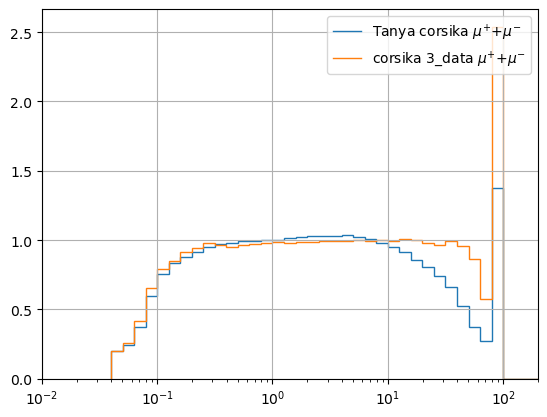

In [ ]:
cdata = combined_data(en_hist_tanya, (-13, 13), 3)
plt.stairs(cdata[0]/mceq_dist.flux["mu"], cdata[1], label = f"Tanya corsika {cdata[2]}")

cdata = combined_data(en_hist3, (-13, 13), 3)
plt.stairs(cdata[0]/mceq_dist.flux["mu"], cdata[1], label = f"corsika 3_data {cdata[2]}")

plt.xscale("log")
# plt.yscale("log")
plt.xlim(1e-2, 2e2)
# plt.ylim(-0.01, 0.5)
plt.legend()
plt.grid()

In [ ]:
bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-13, 13), bins = mceq_dist.e_bins)
plt.stairs(hist, bins, label = label, linestyle='-')

# bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-12, -12), bins = mceq_dist.e_bins)
# plt.stairs(hist, bins, label = label, linestyle='-')

# bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-14, 14), bins = mceq_dist.e_bins)
# plt.stairs(hist, bins, label = label, linestyle='-')

cdata = combined_data(en_hist_tanya, (-13, 13), 2)
plt.stairs(*cdata[0:2], label = f"corsika_{cdata[2]}")
# bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-211, 211), bins = mceq_dist.e_bins)
# plt.stairs(hist, bins, label = label, linestyle='-')

# bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (111,), bins = mceq_dist.e_bins)
# plt.stairs(hist, bins, label = label, linestyle='-')

# bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-11, 11), bins = mceq_dist.e_bins)
# plt.stairs(hist, bins, label = label, linestyle='-')

# bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-11,), bins = mceq_dist.e_bins)
# plt.stairs(hist, bins, label = label, linestyle='-')

# bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (11,), bins = mceq_dist.e_bins)
# plt.stairs(hist, bins, label = label, linestyle='-')

plt.stairs(mceq_dist.flux["mu"], mceq_dist.e_bins, 
           label = r"${\mu}^{+} + {\mu}^{-}$ mceq", linestyle='--')
# plt.stairs(mceq_dist.flux["numu"], mceq_dist.e_bins, 
#            label = r"$\bar{\nu}_{\mu} + {\nu}_{\mu}$ mceq", linestyle='--')
# plt.stairs(mceq_dist.flux["nue"], mceq_dist.e_bins, 
#            label = r"$\bar{\nu}_{e} + {\nu}_{e}$ mceq", linestyle='--')
# plt.stairs(mceq_dist.flux["pi"], mceq_dist.e_bins, 
#            label = r"$\bar{\pi}^{+} + {\pi}^{-}$ mceq", linestyle='--')

# plt.stairs(mceq_dist.flux["el"], mceq_dist.e_bins, 
#            label = r"$\bar{e}^{+} + {e}^{-}$ mceq", linestyle='--')

# plt.stairs(mceq_dist.flux["e+"], mceq_dist.e_bins, 
#            label = r"${e}^{+}$ mceq", linestyle='--')

# plt.stairs(mceq_dist.flux["e-"], mceq_dist.e_bins, 
#            label = r"${e}^{-}$ mceq", linestyle='--')

plt.xscale("log")
# plt.yscale("log")
plt.xlim(1e-2, 2e2)
# plt.ylim(-0.01, 0.5)
plt.legend()
plt.grid()

NameError: name 'cascade_analysis' is not defined

Histogram of -13 with mass 0.1056583745
Histogram of 13 with mass 0.1056583745


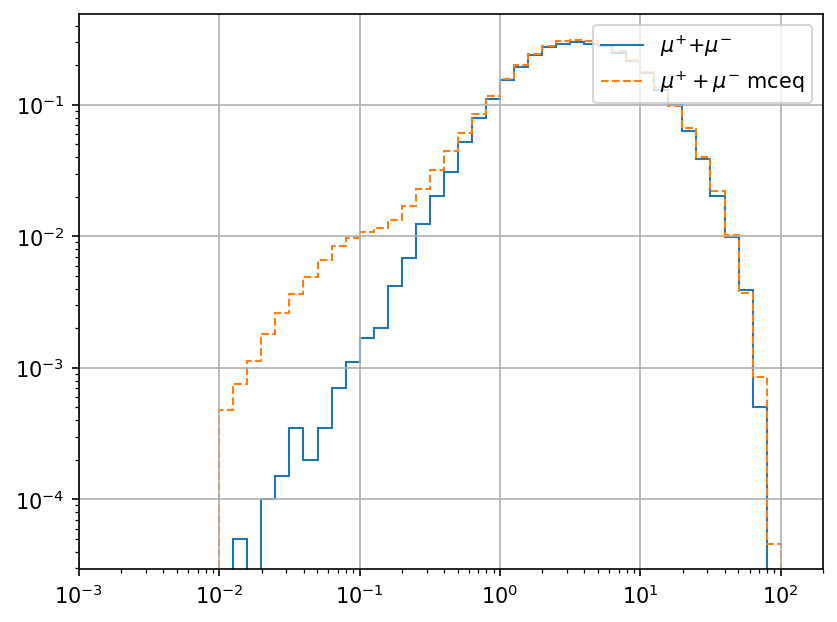

In [ ]:
plt.rcParams["figure.dpi"] = 150

bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-13, 13), bins = mceq_dist.e_bins)
plt.stairs(hist, bins, label = label, linestyle='-')

# bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-12, -12), bins = mceq_dist.e_bins)
# plt.stairs(hist, bins, label = label, linestyle='-')

# bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-14, 14), bins = mceq_dist.e_bins)
# plt.stairs(hist, bins, label = label, linestyle='-')

# bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-211, 211), bins = mceq_dist.e_bins)
# plt.stairs(hist, bins, label = label, linestyle='-')

# bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-11, 11), bins = mceq_dist.e_bins)
# plt.stairs(hist, bins, label = label, linestyle='-')

# bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-11,), bins = mceq_dist.e_bins)
# plt.stairs(hist, bins, label = label, linestyle='-')

# bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (11,), bins = mceq_dist.e_bins)
# plt.stairs(hist, bins, label = label, linestyle='-')

plt.stairs(mceq_dist.flux["mu"], mceq_dist.e_bins, 
           label = r"${\mu}^{+} + {\mu}^{-}$ mceq", linestyle='--')

# plt.stairs(mceq_hybrid.flux["mu"], mceq_dist.e_bins, 
#            label = r"${\mu}^{+} + {\mu}^{-}$ mceq hb", linestyle='--')
# plt.stairs(mceq_dist.flux["numu"], mceq_dist.e_bins, 
#            label = r"$\bar{\nu}_{\mu} + {\nu}_{\mu}$ mceq", linestyle='--')
# plt.stairs(mceq_dist.flux["nue"], mceq_dist.e_bins, 
#            label = r"$\bar{\nu}_{e} + {\nu}_{e}$ mceq", linestyle='--')
# plt.stairs(mceq_dist.flux["pi"], mceq_dist.e_bins, 
#            label = r"$\bar{\pi}^{+} + {\pi}^{-}$ mceq", linestyle='--')

# plt.stairs(mceq_dist.flux["el"], mceq_dist.e_bins, 
#            label = r"$\bar{e}^{+} + {e}^{-}$ mceq", linestyle='--')

# plt.stairs(mceq_dist.flux["e+"], mceq_dist.e_bins, 
#            label = r"${e}^{+}$ mceq", linestyle='--')

# plt.stairs(mceq_dist.flux["e-"], mceq_dist.e_bins, 
#            label = r"${e}^{-}$ mceq", linestyle='--')

plt.xscale("log")
plt.yscale("log")
plt.xlim(1e-3, 2e2)
# plt.ylim(-0.01, 0.5)
plt.legend()
plt.grid()
# plt.savefig('temp.png', transparent=True)

Histogram of -13 with mass 0.1056583745
Histogram of 13 with mass 0.1056583745


/tmp/ipykernel_849944/659946842.py:3: RuntimeWarning: invalid value encountered in divide
  plt.stairs(hist/mceq_dist.flux["mu"], mceq_dist.e_bins,


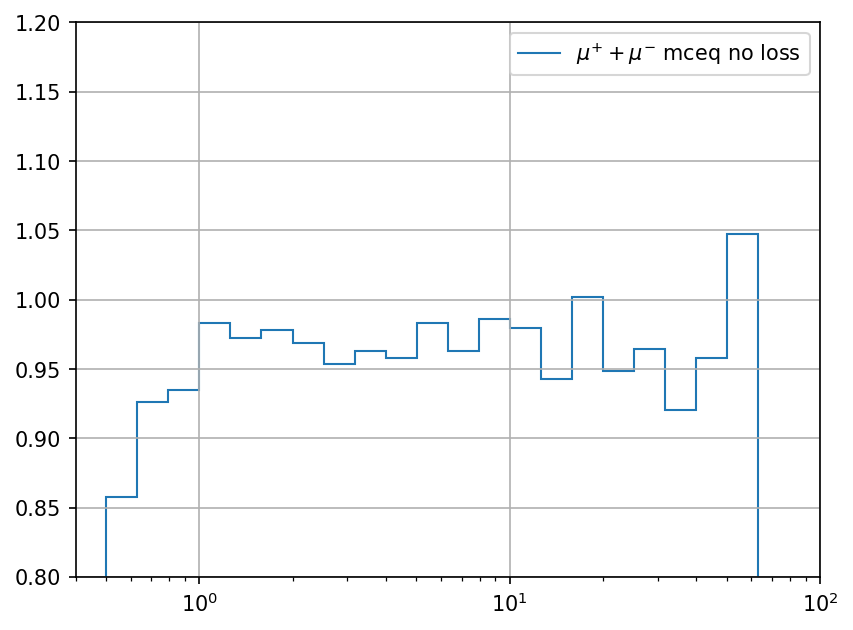

In [ ]:
bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-13, 13), bins = mceq_dist.e_bins)
# plt.stairs(hist, bins, label = label, linestyle='-')
plt.stairs(hist/mceq_dist.flux["mu"], mceq_dist.e_bins, 
           label = r"${\mu}^{+} + {\mu}^{-}$ mceq no loss", linestyle='-')

# bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-12, 12), bins = mceq_dist.e_bins)
# # plt.stairs(hist, bins, label = label, linestyle='-')
# plt.stairs(hist/mceq_dist.flux["nue"], mceq_dist.e_bins, 
#            label = r"${\nu}^{+} + {\nu}^{-}$ mceq no loss", linestyle='-')

# bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-14, 14), bins = mceq_dist.e_bins)
# # plt.stairs(hist, bins, label = label, linestyle='-')
# plt.stairs(hist/mceq_dist.flux["numu"], mceq_dist.e_bins, 
#            label = r"${\nu}^{+} + {\nu}^{-}$ mceq no loss", linestyle='-')

# bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-11, 11), bins = mceq_dist.e_bins)
# # plt.stairs(hist, bins, label = label, linestyle='-')
# plt.stairs(hist/mceq_dist.flux["el"], mceq_dist.e_bins, 
#            label = r"${e}^{+} + {e}^{-}$ mceq no loss", linestyle='-')

# plt.stairs(mceq_loss.flux["mu"], mceq_loss.e_bins, 
#            label = r"${\mu}^{+} + {\mu}^{-}$ mceq loss", linestyle='--')

plt.xscale("log")
plt.xlim(4e-1, 1e2)
plt.ylim(0.8, 1.2)
plt.legend()
plt.grid()

Histogram of -211 with mass 0.13957039000000002
Histogram of 211 with mass 0.13957039000000002


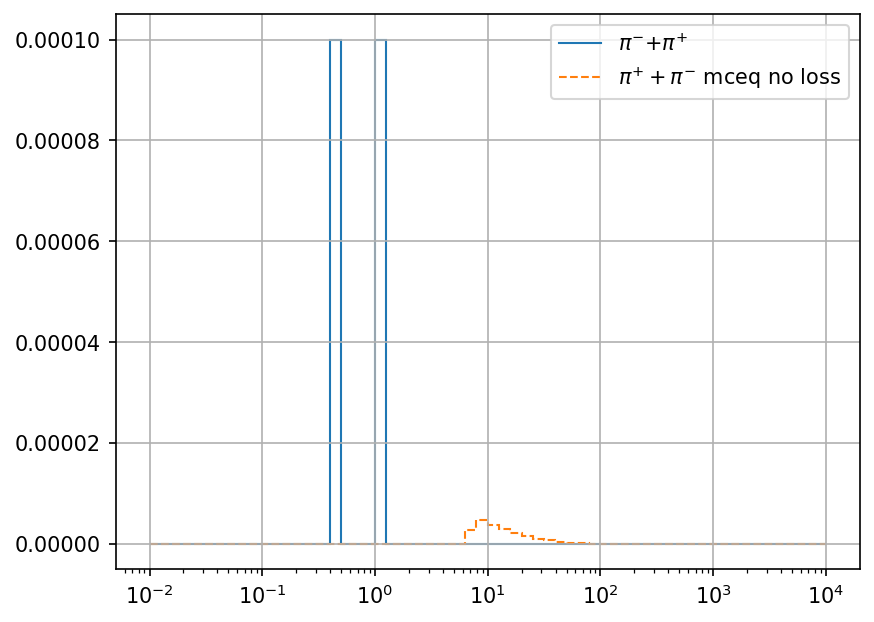

In [ ]:
bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-211, 211), bins = mceq_dist.e_bins)
plt.stairs(hist, bins, label = label, linestyle='-')


plt.stairs(mceq_dist.flux["pi"], mceq_dist.e_bins, 
           label = r"${\pi}^{+} + {\pi}^{-}$ mceq no loss", linestyle='--')

# plt.stairs(mceq_loss.flux["mu"], mceq_loss.e_bins, 
#            label = r"${\mu}^{+} + {\mu}^{-}$ mceq loss", linestyle='--')

plt.xscale("log")
# plt.xlim(1e-2, 2e2)
# plt.ylim(-0.01, 0.5)
plt.legend()
plt.grid()

Histogram of -13 with mass 0.1056583745
Histogram of 13 with mass 0.1056583745
Histogram of -12 with mass 0.0
Histogram of 12 with mass 0.0
Histogram of -14 with mass 0.0
Histogram of 14 with mass 0.0


/tmp/ipykernel_2938205/1991008938.py:2: RuntimeWarning: invalid value encountered in divide
  plt.stairs(hist/mceq_dist.flux["mu"], bins, label = f"{label} cas/mceq", linestyle='-')
/tmp/ipykernel_2938205/1991008938.py:5: RuntimeWarning: invalid value encountered in divide
  plt.stairs(hist/mceq_dist.flux["nue"], bins, label = f"{label} cas/mceq", linestyle='-')
/tmp/ipykernel_2938205/1991008938.py:8: RuntimeWarning: invalid value encountered in divide
  plt.stairs(hist/mceq_dist.flux["numu"], bins, label = f"{label} cas/mceq", linestyle='-')


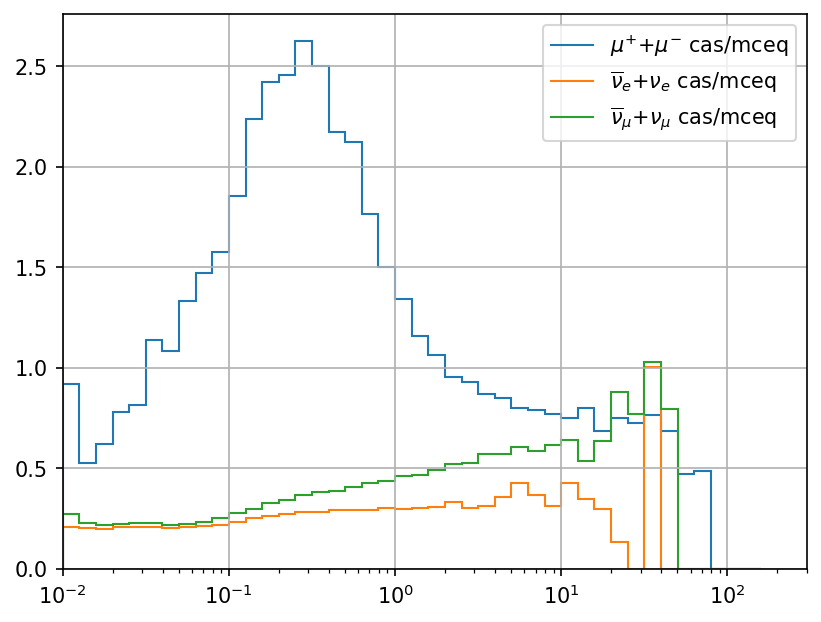

In [ ]:
bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-13, 13), bins = mceq_dist.e_bins)
plt.stairs(hist/mceq_dist.flux["mu"], bins, label = f"{label} cas/mceq", linestyle='-')

bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-12, 12), bins = mceq_dist.e_bins)
plt.stairs(hist/mceq_dist.flux["nue"], bins, label = f"{label} cas/mceq", linestyle='-')

bins, hist, label = cascade_analysis.kin_energy_histogram(pdgs = (-14, 14), bins = mceq_dist.e_bins)
plt.stairs(hist/mceq_dist.flux["numu"], bins, label = f"{label} cas/mceq", linestyle='-')


# plt.stairs(mceq_dist.flux["mu"]/1.1, mceq_dist.e_bins, 
#            label = r"${\mu}^{+} + {\mu}^{-}$ mceq no loss", linestyle='--')

# plt.stairs(mceq_loss.flux["mu"], mceq_loss.e_bins, 
#            label = r"${\mu}^{+} + {\mu}^{-}$ mceq loss", linestyle='--')

plt.xscale("log")
plt.xlim(1e-2, 3e2)
# plt.xlim(4e-1, 3e2)
# plt.ylim(0.8, 1.2)
plt.legend()
plt.grid()

In [ ]:
plt.plot(mceq_loss.e_grid, mceq_loss.flux["mu"], 
         label = r"${\mu}^{+} + {\mu}^{-}$ USStd", linestyle='--')

# plt.plot(mceq_loss_bk.e_grid, mceq_loss_bk.flux["mu"], 
#          label = r"${\mu}^{+} + {\mu}^{-}$ BK_USStd", linestyle='-')

plt.xscale("log")
plt.xlim(4e-1, 2e2)
plt.ylim(-0.01, 0.31)
plt.legend()
plt.savefig('temp1.png', transparent=True)

NameError: name 'mceq_loss' is not defined

In [ ]:
plt.plot(mceq_loss.e_grid, mceq_loss_bk.flux["mu"]/mceq_loss.flux["mu"], 
         label = r"${\mu}^{+} + {\mu}^{-}$ (BK_USStd/USStd)", linestyle='--')

# plt.plot(mceq_loss_bk.e_grid, mceq_loss_bk.flux["mu"], 
#          label = r"${\mu}^{+} + {\mu}^{-}$ bk", linestyle='-')

plt.xscale("log")
plt.xlim(4e-1, 2e2)
# plt.ylim(-0.01, 0.31)
plt.legend()
plt.savefig('temp.png', transparent=True)

In [ ]:
plt.plot(res_mceq.egrid, res_mceq.mu_spec[1], label = f"{res_mceq.mu_spec[2]}", linestyle='--')

plt.xscale("log")
plt.xlim(4e-1, 2e2)
plt.ylim(-0.01, 0.31)
plt.legend()
plt.savefig('temp.png', transparent=True)

In [ ]:
plt.plot(res_mceq.egrid, res_mceq.numu_spec[1], label = f"{res_mceq.numu_spec[2]} stairs", linestyle='--')

plt.xscale("log")
plt.xlim(4e-1, 2e2)
plt.ylim(-0.01, 2.5)
plt.legend()
plt.savefig('temp_line.png', transparent=True)

In [ ]:
plt.xscale("log")
plt.xlim(1e-1, 1e2)
plt.ylim(0.8, 1.2)
plt.step(res_mceq.mu_spec[0], cascade_analysis.mu/res_mceq.mu_spec[1], 
         label = r"${\mu}^{+} + {\mu}^{-}$ casc/mceq", linestyle='-', color = 'red')
plt.step(res_mceq.mu_spec[0], cascade_analysis.numu/res_mceq.numu_spec[1], 
         label = r"$\bar{\nu}_{\mu} + {\nu}_{\mu}$ casc/mceq", linestyle='-', color = 'green')
plt.step(res_mceq.mu_spec[0], cascade_analysis.nue/res_mceq.nue_spec[1], 
         label = r"$\bar{\nu}_{e} + {\nu}_{e}$ casc/mceq", linestyle='-', color = 'blue')
plt.step(res_mceq.mu_spec[0], res_mceq.nue_spec[1]/res_mceq.nue_spec[1], color = 'grey')
plt.legend()

In [ ]:
plt.xscale("log")
# plt.yscale("log")
plt.step(res_mceq.mu_spec[0], res_mceq.mu_spec[1], 
         label = r"${\mu}^{+} + {\mu}^{-}$ mceq", linestyle='--', color = 'red')
plt.step(res_mceq.mu_spec[0], cascade_analysis.mu, 
         label = r"${\mu}^{+} + {\mu}^{-}$ casc", linestyle='-', color = 'red')
plt.step(res_mceq.mu_spec[0], res_mceq.numu_spec[1], 
         label = r"$\bar{\nu}_{\mu} + {\nu}_{\mu}$ mceq", linestyle=':', color = 'green')
plt.step(res_mceq.mu_spec[0], cascade_analysis.numu, 
         label = r"$\bar{\nu}_{\mu} + {\nu}_{\mu}$ casc", linestyle='-', color = 'green')
plt.step(res_mceq.mu_spec[0], res_mceq.nue_spec[1], 
         label = r"$\bar{\nu}_{e} + {\nu}_{e}$ mceq", linestyle=':', color = 'blue')
plt.step(res_mceq.mu_spec[0], cascade_analysis.nue, 
         label = r"$\bar{\nu}_{e} + {\nu}_{e}$ casc", linestyle='-', color = 'blue')
# plt.step(res_mceq.numu_spec[0], res_mceq.numu_spec[1], label = res_mceq.numu_spec[2], linestyle='--')
# plt.step(res_mceq.nue_spec[0], res_mceq.nue_spec[1], label = res_mceq.nue_spec[2], linestyle='--')
plt.xlim(1e-1, 1e3)
# plt.ylim(0, 0.5)
plt.legend()

In [ ]:
plt.xscale("log")
plt.yscale("log")
plt.step(res_mceq.mu_spec[0], cascade_analysis.numu_from_mu, 
         label = r"$\bar{\nu}_{\mu} + {\nu}_{\mu}$ from muons", linestyle='--', color = 'green')
plt.step(res_mceq.mu_spec[0], cascade_analysis.numu_from_other, 
         label = r"$\bar{\nu}_{\mu} + {\nu}_{\mu}$ from other", linestyle=':', color = 'green')
plt.step(res_mceq.mu_spec[0], cascade_analysis.numu, 
         label = r"$\bar{\nu}_{\mu} + {\nu}_{\mu}$ total", linestyle='-', color = 'green')
plt.step(res_mceq.mu_spec[0], cascade_analysis.nue_from_mu, 
         label = r"$\bar{\nu}_{e} + {\nu}_{e}$ from muons", linestyle='--', color = 'blue')
plt.step(res_mceq.mu_spec[0], cascade_analysis.nue_from_other, 
         label = r"$\bar{\nu}_{e} + {\nu}_{e}$ from other", linestyle=':', color = 'blue')
plt.step(res_mceq.mu_spec[0], cascade_analysis.nue, 
         label = r"$\bar{\nu}_{e} + {\nu}_{e}$ total", linestyle='-', color = 'blue')
# plt.step(res_mceq.numu_spec[0], res_mceq.numu_spec[1], label = res_mceq.numu_spec[2], linestyle='--')
# plt.step(res_mceq.nue_spec[0], res_mceq.nue_spec[1], label = res_mceq.nue_spec[2], linestyle='--')
plt.xlim(1e-1, 1e3)
plt.legend()

In [ ]:
from fluka_comparison.fluka_muon_data import fluka_en_dist

In [ ]:
for name, value in fluka_en_dist().items():
    # plt.steps(value[0], value[1])
    plt.stairs(value[1], value[0], label = f"depth = {name}")
    en_bins = value[0]

gr, cnt = np.histogram(cascade_analysis.raw_muon_data[0], bins=en_bins)
gr = gr/cascade_analysis.raw_muon_data[1] 
print(cnt, gr)
plt.stairs(gr, cnt, label = "depth = 635.955, cas")
plt.legend()
plt.ylim(0, 2) 

# gr1, cnt = np.histogram(self.neutrinos_from_muons[muon_neut].energy, bins = nbins, range = xrange)
#         gr1 = gr1/runs_number
#         plt.step(mceq_egrid, gr1, lab

In [ ]:
cascade_analysis.plot_xdepth_list(nbins = 100, pids = [-14, 14, 2212, -13, 13], 
                                  xrange = (0, 1012), per_run = True)

In [ ]:
cascade_analysis.plot_xdepth_stop(nbins = 100, pids = [-14, 14, 2212, -13, 13, 22], #pids = None, 
                                  all_pids = True, 
                                  xrange = (0, 1168), per_run = False)

In [ ]:
cascade_analysis.plot_height_list(pids = [22, -13, 13, -11, 11], all_pids=True)

In [ ]:
cascade_analysis.digitize()

In [ ]:
import matplotlib.pylab as plt
plt.semilogx(cascade_analysis.egrid, cascade_analysis.hist_dict[22][0][99])



len(cascade_analysis.hist_dict[22][0])